# Project Description

## Import Libraries

In [1]:
import scjpnlib.utils as scjpnutils
from scjpnlib.utils import sql_manager as sqlmgr
import pandas as pd
import numpy as np

from IPython.core.display import HTML, Markdown
from scjpnlib.utils.file_io import FileManager
import matplotlib.pyplot as plt
import seaborn as sns
import re

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.multiclass import OneVsRestClassifier
from scjpnlib.utils.skl_transformers import DropColumnsTransformer, LambdaTransformer, SimpleValueTransformer, OneHotEncodingTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split

%load_ext autoreload
%autoreload 2

pysqldfmgr = sqlmgr.PySQLDFManager(globals())

## Read Config for this Experiment

The following reads properties from the `experiment-config.txt` file as JSON.  (see the `experiment-config.txt` file for documentation on different experiment configs)

In [2]:
fm = FileManager()
eda_config = fm.load_json('eda-config.txt')
eda_config

{'official_data': {'unlabeled_predictors': {'url': 'https://s3.amazonaws.com/drivendata-prod/data/7/public/702ddfc5-68cd-4d1d-a0de-f5f566f76d91.csv',
   'local_fname': 'Taarifa-Unlabeled-Predictors.csv'},
  'labeled_predictors': {'url': 'https://s3.amazonaws.com/drivendata-prod/data/7/public/4910797b-ee55-40a7-8668-10efd5c1b960.csv',
   'local_fname': 'Taarifa-Labeled-Predictors.csv'},
  'labels': {'url': 'https://s3.amazonaws.com/drivendata-prod/data/7/public/0bf8bc6e-30d0-4c50-956a-603fc693d966.csv',
   'local_fname': 'Taarifa-Labels.csv'}},
 'eda_desc': {'short': '0.10 test_ratio, flat insig cat hat handling with threshold 10; location based on ward'},
 'test_ratio': 0.1,
 'SEED': 42,
 'insig_cat_handling': {'installer': {'strategy': 'flat',
   'threshold': 10,
   'map_to': 'other'},
  'scheme_name': {'strategy': 'flat', 'threshold': 10, 'map_to': 'other'},
  'ward': {'strategy': 'flat', 'threshold': 10, 'map_to': 'other'}},
 'wrangled_data': {'fname_ext': 'csv',
  'train': {'fname_

In [3]:
display(HTML(f"<b>NOTE: <i>for the above experiement configuration, wrangled and partitioned label files will be identified (filename suffix) by: hash digest: {scjpnutils.json_to_md5_hash_digest(eda_config)}</i></b>"))

## Obtain the Data

In [4]:
fname_unlabeled_predictors = eda_config['official_data']['unlabeled_predictors']['local_fname']
fname_labeled_predictors = eda_config['official_data']['labeled_predictors']['local_fname']
fname_labels = eda_config['official_data']['labels']['local_fname']

ds_map = {
    fname_unlabeled_predictors: eda_config['official_data']['unlabeled_predictors']['url'], 
    fname_labeled_predictors: eda_config['official_data']['unlabeled_predictors']['url'],
    fname_labels: eda_config['official_data']['unlabeled_predictors']['url']
}

fm.validate_download(ds_map)

## Explore the Data

In [5]:
SEED = eda_config['SEED'] # for random_state reproducability

In [6]:
labels = pd.read_csv(fname_labels)
labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            59400 non-null  int64 
 1   status_group  59400 non-null  object
dtypes: int64(1), object(1)
memory usage: 928.2+ KB


In [7]:
classes = labels.status_group.unique()

In [8]:
X_unlabeled = pd.read_csv(fname_unlabeled_predictors)

X_labeled = pd.read_csv(fname_labeled_predictors)
X_labeled.info()

unexamined_predictors = list(X_labeled.columns)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55765 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

In [9]:
scjpnutils.analyze_values(X_labeled, 'X_labeled');

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,id,int64,59400,"[69572, 8776, 34310, 67743, 19728, 9944, 19816...",1.000000,0.00,0,0.000000,None
1,amount_tsh,float64,98,"[6000.0, 0.0, 25.0, 20.0, 200.0, 500.0, 50.0, ...",0.001650,99.84,0,0.000000,None
2,date_recorded,object,356,"[2011-03-14, 2013-03-06, 2013-02-25, 2013-01-2...",0.005993,99.40,0,0.000000,None
3,funder,object,1898,"[Roman, Grumeti, Lottery Club, Unicef, Action ...",0.031953,96.80,3635,0.061195,"Int64Index([ 34, 43, 47, 65, 71,..."
4,gps_height,int64,2428,"[1390, 1399, 686, 263, 0, 62, 1062, 1368, 1645...",0.040875,95.91,0,0.000000,None
5,installer,object,2146,"[Roman, GRUMETI, World vision, UNICEF, Artisan...",0.036128,96.39,3655,0.061532,"Int64Index([ 34, 43, 47, 65, 71,..."
6,longitude,float64,57516,"[34.93809275, 34.6987661, 37.46066446, 38.4861...",0.968283,3.17,0,0.000000,None
7,latitude,float64,57517,"[-9.85632177, -2.14746569, -3.82132853, -11.15...",0.968300,3.17,0,0.000000,None
8,wpt_name,object,37400,"[none, Zahanati, Kwa Mahundi, Zahanati Ya Nany...",0.629630,37.04,0,0.000000,None
9,num_private,int64,65,"[0, 39, 5, 45, 6, 3, 698, 32, 15, 7, 25, 102, ...",0.001094,99.89,0,0.000000,None


In [10]:
unexamined_candidate_removal_predictors = list(X_labeled.columns)

<p><br><br>

<h2>Clean LABELED Predictors</h2>
Since we want to be able to reproduce all EDA/data-cleaning steps easily, we'll initialize a Pipeline and add steps to it as we go.

In [11]:
data_cleaner = Pipeline(steps=[('passthrough', None)])

<p><br>
<h3>Drop Features that do NOT contribute to Classification</h3>

<p><br>
<h4>KNOWN NON-CONTRIBUTION</h4>

In [12]:
# using descriptions provided by https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list when available
# id: pure identification
# funder: "Who funded the well", the meaningful information seems to be held in payment
# wpt_name: "Name of the waterpoint if there is one" - again, identification purposes and will not contribute to classification
# recorded_by: "Group entering this row of data" and is constant for every observation - will not contribute to classification
non_contrib_feats = feats_to_reintegrate_later = [
    'id', 
    'funder',
    'wpt_name', 
    'recorded_by'
]
X_labeled_reintegrate_later = X_labeled[feats_to_reintegrate_later]
for non_contrib_feat in non_contrib_feats:
    unexamined_predictors.remove(non_contrib_feat)

dct_non_contrib_predictors = DropColumnsTransformer(non_contrib_feats)
# basis for cleaned labeled predictors
X_labeled_clean = dct_non_contrib_predictors.fit_transform(X_labeled)

# do the same for "throw-away" version of X_unlabeled since we will use union of unique categories between it and X_labeled_clean for one-hot encoding
X_unlabeled_throw_away = dct_non_contrib_predictors.fit_transform(X_unlabeled)

unexamined_candidate_removal_predictors = list(filter(lambda p: p not in non_contrib_feats, unexamined_candidate_removal_predictors))

# add this step to the pipeline
data_cleaner.steps.append(['drop_non_contrib name', dct_non_contrib_predictors])

<p><br>
<h3>Fix/replace NULL/MISSING values</h3>

<h4>funder:</h4>

In [13]:
# check to see if there is an appropriate value in X_labeled.funder to indicate null - e.g. 'None' or 'none'
scjpnutils.index_of_values(X_labeled, 'X_labeled', 'funder', ['None', 'none'])

(array([ 4868, 19055]), array(['None'], dtype=object))

In [14]:
# so let's replace all null funder values with 'None'
replace_null_rules = {'funder': [{'missing_values': np.nan, 'strategy': 'constant', 'fill_value': 'None'}]}

<p><br>
<h4>installer:</h4>

In [15]:
# check to see if there is an appropriate value in X_labeled.installer to indicate null - e.g. 'None' or 'none'
scjpnutils.index_of_values(X_labeled, 'X_labeled', 'installer', ['None', 'none'])

(array([], dtype=int64), array([], dtype=object))

In [16]:
# there doesn't appear to be, so let's create this semantic and replace all null installer values with 'None'
replace_null_rules['installer'] = [
    {
        'missing_values': np.nan,
        'strategy': 'constant', 
        'fill_value': 'None'
    }
]

<p><br>
<h4>subvillage:</h4>

In [17]:
# check to see if there is an appropriate value in X_labeled.subvillage to indicate null - e.g. 'None' or 'none'
scjpnutils.index_of_values(X_labeled, 'X_labeled', 'subvillage', ['None', 'none'])

(array([], dtype=int64), array([], dtype=object))

In [18]:
replace_null_rules['subvillage'] = [
    {
        'missing_values': np.nan,
        'strategy': 'constant', 
        'fill_value': 'None'
    }
]

<p><br>
<h4>public_meeting:</h4>

In [19]:
# we see above that list of unique values for public_meeting is [True, nan, False] so we will replace nan (null) with False - we don't know that this is correct yet... default could be True
replace_null_rules['public_meeting'] = [
    {
        'missing_values': np.nan,
        'strategy': 'constant', 
        'fill_value': False
    }
]

<p><br>
<h4>scheme_management:</h4>

In [20]:
X_labeled.scheme_management.unique()

array(['VWC', 'Other', nan, 'Private operator', 'WUG', 'Water Board',
       'WUA', 'Water authority', 'Company', 'Parastatal', 'Trust', 'SWC',
       'None'], dtype=object)

In [21]:
# we see above that list of unique values for scheme_management has 'None' so we will replace nan (null) with 'None'
replace_null_rules['scheme_management'] = [
    {
        'missing_values': np.nan,
        'strategy': 'constant', 
        'fill_value': 'None'
    }
]

<p><br>
<h4>scheme_name:</h4>

In [22]:
# check to see if there is an appropriate value in X_labeled.scheme_name to indicate null - e.g. 'None' or 'none'
scjpnutils.index_of_values(X_labeled, 'X_labeled', 'scheme_name', ['None', 'none'])

(array([   14,   101,   572,   614,   619,   705,   708,   732,   781,
          855,   887,   893,  1036,  1133,  1188,  1244,  1405,  1538,
         1645,  1672,  1760,  1850,  1869,  1871,  2180,  2181,  2203,
         2302,  2392,  2570,  2730,  2736,  2764,  2769,  2852,  3053,
         3339,  3352,  3356,  3676,  3741,  3890,  4028,  4046,  4121,
         4271,  4290,  4376,  4567,  4604,  4661,  4665,  4678,  4713,
         4757,  4758,  4773,  4827,  4898,  5002,  5172,  5200,  5254,
         5325,  5343,  5488,  5492,  5496,  5595,  5693,  5791,  5828,
         5853,  6162,  6225,  6244,  6476,  6537,  6599,  6685,  6728,
         6734,  6811,  6850,  6980,  7182,  7184,  7193,  7239,  7333,
         7655,  7679,  8190,  8263,  8320,  8377,  8590,  8755,  8816,
         8864,  8885,  8968,  9025,  9224,  9287,  9435,  9459,  9476,
         9778,  9788,  9938, 10063, 10115, 10167, 10217, 10221, 10319,
        10378, 10460, 10565, 10624, 10693, 10826, 10849, 10903, 11051,
      

In [23]:
# from the above, we see that scheme_name has BOTH 'None' and 'none', so we will replace nan and 'none' with 'None'
replace_null_rules['scheme_name'] = [
    {
        'missing_values': np.nan,
        'strategy': 'constant', 
        'fill_value': 'None'
    },
    {
        'missing_values': 'none',
        'strategy': 'constant', 
        'fill_value': 'None'
    }
]

<p><br>
<h4>permit:</h4>

In [24]:
# we see above that list of unique values for permit is [True, nan, False] so we will replace nan (null) with False
replace_null_rules['permit'] = [
    {
        'missing_values': np.nan,
        'strategy': 'constant', 
        'fill_value': False
    }
]

<p><br>
<h4>Now execute the above null-value replacement rules</h4>

In [25]:
svt_null_predictors = SimpleValueTransformer(replace_null_rules)

X_labeled_clean = svt_null_predictors.fit_transform(X_labeled_clean)

# do the same for "throw-away" version of X_unlabeled since we will use union of unique categories between it and X_labeled_clean for one-hot encoding
X_unlabeled_throw_away = svt_null_predictors.transform(X_unlabeled_throw_away)

# add this step to the pipeline
data_cleaner.steps.append(['null_imputer name', svt_null_predictors])

In [26]:
scjpnutils.analyze_values(X_labeled_clean, 'X_labeled_clean', standard_options_kargs={'sort_unique_vals':True});

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,amount_tsh,float64,98,"[0.0, 0.2, 0.25, 1.0, 2.0, 5.0, 6.0, 7.0, 9.0,...",0.001650,99.84,0,0.0,None
1,date_recorded,object,356,"[2002-10-14, 2004-01-07, 2004-03-01, 2004-03-0...",0.005993,99.40,0,0.0,None
2,gps_height,int64,2428,"[-90, -63, -59, -57, -55, -54, -53, -52, -51, ...",0.040875,95.91,0,0.0,None
3,installer,object,2146,"[-, 0, A.D.B, AAR, ABASIA, ABD, ABDALA, ABDUL,...",0.036128,96.39,0,0.0,None
4,longitude,float64,57516,"[0.0, 29.6071219, 29.60720109, 29.61032056, 29...",0.968283,3.17,0,0.0,None
5,latitude,float64,57517,"[-11.64944018, -11.64837759, -11.58629656, -11...",0.968300,3.17,0,0.0,None
6,num_private,int64,65,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14,...",0.001094,99.89,0,0.0,None
7,basin,object,9,"[Internal, Lake Nyasa, Lake Rukwa, Lake Tangan...",0.000152,99.98,0,0.0,None
8,subvillage,object,19288,"[##, 'A' Kati, 1, 14Kambalage, 18, 19, 20, 22B...",0.324714,67.53,0,0.0,None
9,region,object,21,"[Arusha, Dar es Salaam, Dodoma, Iringa, Kagera...",0.000354,99.96,0,0.0,None


As you can see above, there are now no features with null/missing values.

<p><br>
<h3>Drop Features that DUPLICATE other Features</h3>

In [27]:
dup_features_to_drop = []

In [28]:
extraction_type_feats = [
    'extraction_type', # "The kind of extraction the waterpoint uses", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'extraction_type_group', # "The kind of extraction the waterpoint uses", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'extraction_type_class' # "The kind of extraction the waterpoint uses", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
]

scjpnutils.analyze_duplicates('Extraction', extraction_type_feats, 'X_labeled_clean', X_labeled_clean)

,feature,dtype,n_unique,unique_vals
0,extraction_type,object,18,"[afridev, cemo, climax, gravity, india mark ii..."
1,extraction_type_group,object,13,"[afridev, gravity, india mark ii, india mark i..."
2,extraction_type_class,object,7,"[gravity, handpump, motorpump, other, rope pum..."


,extraction_type,extraction_type_class
6,swn 80,handpump
7,nira/tanira,handpump
8,india mark ii,handpump
9,nira/tanira,handpump
11,swn 80,handpump
12,nira/tanira,handpump
14,nira/tanira,handpump
15,swn 80,handpump
21,swn 80,handpump
26,india mark ii,handpump


,extraction_type,extraction_type_group
31,ksb,submersible
45,windmill,wind-powered
66,other - rope pump,rope pump
88,ksb,submersible
92,ksb,submersible
96,ksb,submersible
147,other - rope pump,rope pump
155,other - swn 81,other handpump
172,ksb,submersible
193,ksb,submersible


,extraction_type_group,extraction_type_class
6,swn 80,handpump
7,nira/tanira,handpump
8,india mark ii,handpump
9,nira/tanira,handpump
11,swn 80,handpump
12,nira/tanira,handpump
14,nira/tanira,handpump
15,swn 80,handpump
21,swn 80,handpump
26,india mark ii,handpump


We will settle on keeping <b>extraction_type_class</b> since it represents class membership for each instance of <b>extraction_type</b> and <b>extraction_type_group</b> (which will be dropped).

In [29]:
dup_features_to_drop.append('extraction_type')
feats_to_reintegrate_later.append('extraction_type')

dup_features_to_drop.append('extraction_type_group')
feats_to_reintegrate_later.append('extraction_type_group')

unexamined_candidate_removal_predictors = list(filter(lambda p: p not in extraction_type_feats, unexamined_candidate_removal_predictors))

<p><br>

In [30]:
management_feats = [
    'management', # "How the waterpoint is managed", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'management_group' # "How the waterpoint is managed", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
]

scjpnutils.analyze_duplicates('Management', management_feats, 'X_labeled_clean', X_labeled_clean)

,feature,dtype,n_unique,unique_vals
0,management,object,12,"[company, other, other - school, parastatal, p..."
1,management_group,object,5,"[commercial, other, parastatal, unknown, user-..."


,management,management_group
0,vwc,user-group
1,wug,user-group
2,vwc,user-group
3,vwc,user-group
5,vwc,user-group
6,vwc,user-group
7,wug,user-group
8,vwc,user-group
9,vwc,user-group
10,private operator,commercial


We will settle on keeping <b>management_group</b> since it represents class membership for each instance of <b>management</b> (which will be dropped).

In [31]:
dup_features_to_drop.append('management')
feats_to_reintegrate_later.append('management')

unexamined_candidate_removal_predictors = list(filter(lambda p: p not in management_feats, unexamined_candidate_removal_predictors))

<p><br>

In [32]:
payment_feats = [
    'payment', # "What the water costs", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'payment_type' # "What the water costs", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
]

scjpnutils.analyze_duplicates('Payment', payment_feats, 'X_labeled_clean', X_labeled_clean)

,feature,dtype,n_unique,unique_vals
0,payment,object,7,"[never pay, other, pay annually, pay monthly, ..."
1,payment_type,object,7,"[annually, monthly, never pay, on failure, oth..."


,payment,payment_type
0,pay annually,annually
2,pay per bucket,per bucket
5,pay per bucket,per bucket
11,pay when scheme fails,on failure
13,pay monthly,monthly
16,pay monthly,monthly
17,pay when scheme fails,on failure
19,pay annually,annually
20,pay monthly,monthly
23,pay monthly,monthly


Each set is the same length in magnitude but we will settle on keeping <b>payment_type</b> since its categories contain the same information in a smaller memory footprint than <b>payment</b> (which will be dropped).

In [33]:
dup_features_to_drop.append('payment')
feats_to_reintegrate_later.append('payment')

unexamined_candidate_removal_predictors = list(filter(lambda p: p not in payment_feats, unexamined_candidate_removal_predictors))

<p><br>

In [34]:
quality_feats = [
    'water_quality', # "The quality of the water", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'quality_group' # "The quality of the water", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
]

scjpnutils.analyze_duplicates('Quality', quality_feats, 'X_labeled_clean', X_labeled_clean)

,feature,dtype,n_unique,unique_vals
0,water_quality,object,8,"[coloured, fluoride, fluoride abandoned, milky..."
1,quality_group,object,6,"[colored, fluoride, good, milky, salty, unknown]"


,water_quality,quality_group
0,soft,good
1,soft,good
2,soft,good
3,soft,good
4,soft,good
6,soft,good
9,soft,good
11,soft,good
12,soft,good
13,soft,good


We will settle on keeping <b>quality_group</b> since it represents class membership for each instance of <b>water_quality</b> (which will be dropped).  In addition, <b>quality_group</b> makes clear when water quality is "good" via the <b>good</b> class, while the corresponding category <b>soft</b> in <b>water_quality</b> may not be as clear to non-technical stakeholders.

In [35]:
dup_features_to_drop.append('water_quality')
feats_to_reintegrate_later.append('water_quality')

unexamined_candidate_removal_predictors = list(filter(lambda p: p not in quality_feats, unexamined_candidate_removal_predictors))

<p><br>

In [36]:
quantity_feats = [
    'quantity', # "The quantity of water", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'quantity_group' # "The quantity of water", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
]

scjpnutils.analyze_duplicates('Quantity', quantity_feats, 'X_labeled_clean', X_labeled_clean)

,feature,dtype,n_unique,unique_vals
0,quantity,object,5,"[dry, enough, insufficient, seasonal, unknown]"
1,quantity_group,object,5,"[dry, enough, insufficient, seasonal, unknown]"


,quantity,quantity_group


It certainly does not get any clearer than that, does it?!  Each set is the same length in magnitude and has the exact same categories but, since we will be one-hot encoding later, the column name of <b>quantity</b> will have a a smaller memory footprint than <b>quantity_group</b> (which will be dropped).

In [37]:
dup_features_to_drop.append('quantity_group')
feats_to_reintegrate_later.append('quantity_group')

unexamined_candidate_removal_predictors = list(filter(lambda p: p not in quantity_feats, unexamined_candidate_removal_predictors))

<p><br>

In [38]:
source_feats = [
    'source', # "The source of the water", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'source_type', # "The source of the water", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'source_class' # "The source of the water", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
]

scjpnutils.analyze_duplicates('Source', source_feats, 'X_labeled_clean', X_labeled_clean)

,feature,dtype,n_unique,unique_vals
0,source,object,10,"[dam, hand dtw, lake, machine dbh, other, rain..."
1,source_type,object,7,"[borehole, dam, other, rainwater harvesting, r..."
2,source_class,object,3,"[groundwater, surface, unknown]"


,source_type,source_class
0,spring,groundwater
1,rainwater harvesting,surface
2,dam,surface
3,borehole,groundwater
4,rainwater harvesting,surface
5,other,unknown
6,borehole,groundwater
7,shallow well,groundwater
8,borehole,groundwater
9,shallow well,groundwater


,source,source_class
0,spring,groundwater
1,rainwater harvesting,surface
2,dam,surface
3,machine dbh,groundwater
4,rainwater harvesting,surface
5,other,unknown
6,machine dbh,groundwater
7,shallow well,groundwater
8,machine dbh,groundwater
9,shallow well,groundwater


,source,source_type
3,machine dbh,borehole
6,machine dbh,borehole
8,machine dbh,borehole
10,machine dbh,borehole
15,machine dbh,borehole
16,river,river/lake
17,river,river/lake
22,river,river/lake
23,river,river/lake
26,machine dbh,borehole


This one is a bit tricker in that there isn't much overlap between explicit category values.  From the outset, we see that <b>source_class</b> is far too general and both of the other categorical variables contain more specific/differentiating categories.  So, <b>source_class</b> will be dropped.  Between <b>source</b> and <b>source_type</b> there is a lot of overlap in categories.  But <b>source</b> contains mutually exclusive (orthogonal) categories while <b>source_type</b> contains some categories which combine would-be orthogonal categories - e.g. category <b>river/lake</b> in <b>source_type</b>.  In addition, during one-hot encoding the presence of a "/", while can be dealt with, adds extra, unecessary work when <b>source</b> does not.

In [39]:
dup_features_to_drop.append('source_class')
feats_to_reintegrate_later.append('source_class')

dup_features_to_drop.append('source_type')
feats_to_reintegrate_later.append('source_type')

unexamined_candidate_removal_predictors = list(filter(lambda p: p not in source_feats, unexamined_candidate_removal_predictors))

<p><br>

In [40]:
waterpoint_feats = [
    'waterpoint_type', # "The kind of waterpoint", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'waterpoint_type_group' # "The kind of waterpoint", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
]

scjpnutils.analyze_duplicates('Waterpoint', waterpoint_feats, 'X_labeled_clean', X_labeled_clean)

,feature,dtype,n_unique,unique_vals
0,waterpoint_type,object,7,"[cattle trough, communal standpipe, communal s..."
1,waterpoint_type_group,object,6,"[cattle trough, communal standpipe, dam, hand ..."


,waterpoint_type,waterpoint_type_group
2,communal standpipe multiple,communal standpipe
3,communal standpipe multiple,communal standpipe
5,communal standpipe multiple,communal standpipe
53,communal standpipe multiple,communal standpipe
55,communal standpipe multiple,communal standpipe
62,communal standpipe multiple,communal standpipe
75,communal standpipe multiple,communal standpipe
89,communal standpipe multiple,communal standpipe
95,communal standpipe multiple,communal standpipe
96,communal standpipe multiple,communal standpipe


This one is fairly straightforward.  Since the task is aimed at pump-condition (including failure) classification and it stands to reason that a <b>communal standpipe multiple</b> has more potential points of failure (relative to a single <b>communal standpipe</b>), then it would be valuable to capture this information held in <b>waterpoint_type</b>.

In [41]:
dup_features_to_drop.append('waterpoint_type_group')
feats_to_reintegrate_later.append('waterpoint_type_group')

unexamined_candidate_removal_predictors = list(filter(lambda p: p not in waterpoint_feats, unexamined_candidate_removal_predictors))

<p><br>

In [42]:
geoloc_feats = [
    'longitude', # "GPS coordinate", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'latitude', # "GPS coordinate", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'gps_height', # "Altitude of the well", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'subvillage', # "Geographic location", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'region', # "Geographic location", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'region_code', # "Geographic location", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'district_code', # "Geographic location", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'lga', # "Geographic location", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'ward' # "Geographic location", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
]

scjpnutils.analyze_duplicates('Geographic Location', geoloc_feats, 'X_labeled_clean', X_labeled_clean)

,feature,dtype,n_unique,unique_vals
0,longitude,float64,57516,"[0.0, 29.6071219, 29.60720109, 29.61032056, 29..."
1,latitude,float64,57517,"[-11.64944018, -11.64837759, -11.58629656, -11..."
2,gps_height,int64,2428,"[-90, -63, -59, -57, -55, -54, -53, -52, -51, ..."
3,subvillage,object,19288,"[##, 'A' Kati, 1, 14Kambalage, 18, 19, 20, 22B..."
4,region,object,21,"[Arusha, Dar es Salaam, Dodoma, Iringa, Kagera..."
5,region_code,int64,27,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
6,district_code,int64,20,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 13, 23, 30, 33, 43..."
7,lga,object,125,"[Arusha Rural, Arusha Urban, Babati, Bagamoyo,..."
8,ward,object,2092,"[Aghondi, Akheri, Arash, Arri, Arusha Chini, B..."


,lga,ward
0,Ludewa,Mundindi
1,Serengeti,Natta
2,Simanjiro,Ngorika
4,Karagwe,Nyakasimbi
5,Mkinga,Moa
6,Shinyanga Rural,Samuye
7,Kahama,Chambo
8,Tabora Urban,Itetemia
9,Karagwe,Kaisho
10,Mkuranga,Tambani


,subvillage,region
0,Mnyusi B,Iringa
1,Nyamara,Mara
2,Majengo,Manyara
3,Mahakamani,Mtwara
4,Kyanyamisa,Kagera
5,Moa/Mwereme,Tanga
6,Ishinabulandi,Shinyanga
7,Nyawishi Center,Shinyanga
8,Imalauduki,Tabora
9,Mkonomre,Kagera


,subvillage,ward
0,Mnyusi B,Mundindi
1,Nyamara,Natta
2,Majengo,Ngorika
3,Mahakamani,Nanyumbu
4,Kyanyamisa,Nyakasimbi
5,Moa/Mwereme,Moa
6,Ishinabulandi,Samuye
7,Nyawishi Center,Chambo
8,Imalauduki,Itetemia
9,Mkonomre,Kaisho


,region,lga
0,Iringa,Ludewa
1,Mara,Serengeti
2,Manyara,Simanjiro
3,Mtwara,Nanyumbu
4,Kagera,Karagwe
5,Tanga,Mkinga
6,Shinyanga,Shinyanga Rural
7,Shinyanga,Kahama
8,Tabora,Tabora Urban
9,Kagera,Karagwe


,region,ward
0,Iringa,Mundindi
1,Mara,Natta
2,Manyara,Ngorika
3,Mtwara,Nanyumbu
4,Kagera,Nyakasimbi
5,Tanga,Moa
6,Shinyanga,Samuye
7,Shinyanga,Chambo
8,Tabora,Itetemia
9,Kagera,Kaisho


,subvillage,lga
0,Mnyusi B,Ludewa
1,Nyamara,Serengeti
2,Majengo,Simanjiro
3,Mahakamani,Nanyumbu
4,Kyanyamisa,Karagwe
5,Moa/Mwereme,Mkinga
6,Ishinabulandi,Shinyanga Rural
7,Nyawishi Center,Kahama
8,Imalauduki,Tabora Urban
9,Mkonomre,Karagwe


,region_code,district_code
0,11,5
1,20,2
2,21,4
3,90,63
4,18,1
5,4,8
6,17,3
7,17,3
8,14,6
9,18,1


,gps_height,district_code
0,1390,5
1,1399,2
2,686,4
3,263,63
4,0,1
5,0,8
6,0,3
7,0,3
8,0,6
9,0,1


,gps_height,region_code
0,1390,11
1,1399,20
2,686,21
3,263,90
4,0,18
5,0,4
6,0,17
7,0,17
8,0,14
9,0,18


,longitude,latitude
0,34.938093,-9.856322
1,34.698766,-2.147466
2,37.460664,-3.821329
3,38.486161,-11.155298
4,31.130847,-1.825359
5,39.172796,-4.765587
6,33.362410,-3.766365
7,32.620617,-4.226198
8,32.711100,-5.146712
9,30.626991,-1.257051


It is easy to think that all of the above information is important since there is little to no overlap when holding data-types fixed.  However, all of this information, per the descriptions provided, refer to a location.  We already have not only very precise information contained in <b>longitude</b> and <b>latitude</b>, but even more information with the addition of <b>gps_height</b>.  Additionally, every other bit of location information can be mapped from GPS coordinates, therefore we will drop every Geographic Location feature other than <b>longitude</b>, <b>latitude</b>, and <b>gps_height</b>.

In [43]:
geoloc_feats_to_drop = geoloc_feats.copy()

# keep these
# geoloc_feats_to_drop.remove('longitude') # these were good - accuracy greater than 80.5%
# geoloc_feats_to_drop.remove('latitude') # these were good - accuracy greater than 80.5%
# geoloc_feats_to_drop.remove('region') # not good - accuracy dropped
geoloc_feats_to_drop.remove('ward')
geoloc_feats_to_drop.remove('gps_height')

dup_features_to_drop.extend(geoloc_feats_to_drop)
feats_to_reintegrate_later.extend(geoloc_feats_to_drop)

for geoloc_feat_to_drop in geoloc_feats_to_drop:
    unexamined_predictors.remove(geoloc_feat_to_drop)

<p><br>
<h4>Now execute the drop</h4>

In [44]:
scjpnutils.analyze_values(X_labeled_clean, 'X_labeled_clean (BEFORE dropping similar features)', standard_options_kargs={'sort_unique_vals':True,'hide_cols':True});
display(HTML("<br><br>"))

X_labeled_reintegrate_later = X_labeled[feats_to_reintegrate_later]

dct_dup_predictors = DropColumnsTransformer(dup_features_to_drop)
# basis for cleaned labeled predictors
X_labeled_clean = dct_dup_predictors.fit_transform(X_labeled_clean)

# do the same for "throw-away" version of X_unlabeled since we will use union of unique categories between it and X_labeled_clean for one-hot encoding
X_unlabeled_throw_away = dct_dup_predictors.fit_transform(X_unlabeled_throw_away)

# add this step to the pipeline
data_cleaner.steps.append(['drop_dup name', dct_dup_predictors])

scjpnutils.analyze_values(X_labeled_clean, 'X_labeled_clean (AFTER dropping similar features)', standard_options_kargs={'sort_unique_vals':True,'hide_cols':True});

,feature,dtype,n_unique,unique_vals
0,amount_tsh,float64,98,"[0.0, 0.2, 0.25, 1.0, 2.0, 5.0, 6.0, 7.0, 9.0,..."
1,date_recorded,object,356,"[2002-10-14, 2004-01-07, 2004-03-01, 2004-03-0..."
2,gps_height,int64,2428,"[-90, -63, -59, -57, -55, -54, -53, -52, -51, ..."
3,installer,object,2146,"[-, 0, A.D.B, AAR, ABASIA, ABD, ABDALA, ABDUL,..."
4,longitude,float64,57516,"[0.0, 29.6071219, 29.60720109, 29.61032056, 29..."
5,latitude,float64,57517,"[-11.64944018, -11.64837759, -11.58629656, -11..."
6,num_private,int64,65,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14,..."
7,basin,object,9,"[Internal, Lake Nyasa, Lake Rukwa, Lake Tangan..."
8,subvillage,object,19288,"[##, 'A' Kati, 1, 14Kambalage, 18, 19, 20, 22B..."
9,region,object,21,"[Arusha, Dar es Salaam, Dodoma, Iringa, Kagera..."


,feature,dtype,n_unique,unique_vals
0,amount_tsh,float64,98,"[0.0, 0.2, 0.25, 1.0, 2.0, 5.0, 6.0, 7.0, 9.0,..."
1,date_recorded,object,356,"[2002-10-14, 2004-01-07, 2004-03-01, 2004-03-0..."
2,gps_height,int64,2428,"[-90, -63, -59, -57, -55, -54, -53, -52, -51, ..."
3,installer,object,2146,"[-, 0, A.D.B, AAR, ABASIA, ABD, ABDALA, ABDUL,..."
4,num_private,int64,65,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14,..."
5,basin,object,9,"[Internal, Lake Nyasa, Lake Rukwa, Lake Tangan..."
6,ward,object,2092,"[Aghondi, Akheri, Arash, Arri, Arusha Chini, B..."
7,population,int64,1049,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
8,public_meeting,bool,2,"[False, True]"
9,scheme_management,object,12,"[Company, None, Other, Parastatal, Private ope..."


By doing this, we have reduced what will be our base labeled set of predictors from 35 to 19 features.

Before going further, we will first split our baseline into our corresponding <b>labeled</b> train and test data.

<p><br>
<h3>Test/Train Split</h3>

In [45]:
X_train, X_test, y_train, y_test = train_test_split(X_labeled_clean, labels.status_group, test_size=eda_config['test_ratio'], random_state=SEED)

In [46]:
y_train.value_counts()

functional                 29062
non functional             20506
functional needs repair     3892
Name: status_group, dtype: int64

In [47]:
scjpnutils.analyze_values(pd.DataFrame(y_train, columns=['status_group']), 'y_train');

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,status_group,object,3,"[functional, non functional, functional needs ...",0.000056,99.99,0,0.0,None


In [48]:
scjpnutils.analyze_values(X_train, 'X_train', standard_options_kargs={'sort_unique_vals':True,'hide_cols':True});

,feature,dtype,n_unique,unique_vals
0,amount_tsh,float64,96,"[0.0, 0.2, 0.25, 1.0, 2.0, 5.0, 6.0, 7.0, 9.0,..."
1,date_recorded,object,354,"[2002-10-14, 2004-01-07, 2004-03-01, 2004-03-0..."
2,gps_height,int64,2414,"[-63, -59, -57, -55, -54, -52, -51, -50, -49, ..."
3,installer,object,2037,"[-, 0, A.D.B, AAR, ABASIA, ABD, ABDALA, ABDUL,..."
4,num_private,int64,64,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14,..."
5,basin,object,9,"[Internal, Lake Nyasa, Lake Rukwa, Lake Tangan..."
6,ward,object,2089,"[Aghondi, Akheri, Arash, Arri, Arusha Chini, B..."
7,population,int64,1009,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
8,public_meeting,bool,2,"[False, True]"
9,scheme_management,object,12,"[Company, None, Other, Parastatal, Private ope..."


<p><br><br>
<h3>Identify and Prepare CONTINUOUS (ordinal) Features</h3>

First create the `Pipeline` for transforming/cleaning Continuous features.

In [49]:
# Continuous
continuous_transformer = Pipeline(steps=[('data_cleaner', data_cleaner)]) # we already know we need to apply the data cleaning step

In [50]:
cont_feats = [
    'amount_tsh', # "Total static head (amount water available to waterpoint)", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list
    'gps_height', # "Altitude of the well", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/
    # 'longitude', # "GPS coordinate", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/; this is ordinal since it is defined as "Angular distance on the earth's surface, measured east or west from the Prime Meridian"
    # 'latitude', # "GPS coordinate", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/; this is ordinal since it is defined as "The angular distance north or south of the earth's equator, measured in degrees along a meridian"
    'num_private', # no documentation provided at https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/ but we will treat it as ordinal for now since it seems to indicate a count or amount of something
    'population', # "Population around the well", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/
]

# we are going to use the following to engineer the "pump_age" continuous feature
pump_age_feats = [
    'construction_year', # "Year the waterpoint was constructed", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/
    'date_recorded' #  "The date the row was entered", per https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/
]

ft_sel_cont = FunctionTransformer(lambda X: X[cont_feats + pump_age_feats], validate=False)

X_train_cont = ft_sel_cont.fit_transform(X_train)

scjpnutils.analyze_values(X_train_cont, 'X_train_cont', standard_options_kargs={'sort_unique_vals':True,'hide_cols':True});

# add this step to the pipeline
continuous_transformer.steps.append(['sel_cont', ft_sel_cont])

,feature,dtype,n_unique,unique_vals
0,amount_tsh,float64,96,"[0.0, 0.2, 0.25, 1.0, 2.0, 5.0, 6.0, 7.0, 9.0,..."
1,gps_height,int64,2414,"[-63, -59, -57, -55, -54, -52, -51, -50, -49, ..."
2,num_private,int64,64,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14,..."
3,population,int64,1009,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
4,construction_year,int64,55,"[0, 1960, 1961, 1962, 1963, 1964, 1965, 1966, ..."
5,date_recorded,object,354,"[2002-10-14, 2004-01-07, 2004-03-01, 2004-03-0..."


From the above, with the exception of <b>num_private</b>, it is clear that these features are ordinal.  Since we are not given a clear definition of <b>num_private</b> and its data type is `int64`, we will continue to treat it as a <i>Continuous</i> feature.

<p><br>
<h4>Consider Outliers</h4>

We will exclude both <b>construction_year</b> and <b>data_recorded</b> from this list since these will be used to engineer the new <b>pump_age</b> feature.  But we will inspect all of the other continuous features above in detail. 

<p><br>
<h4>amount_tsh:</h4>
<h5>Distribution of value-frequencies</h5>

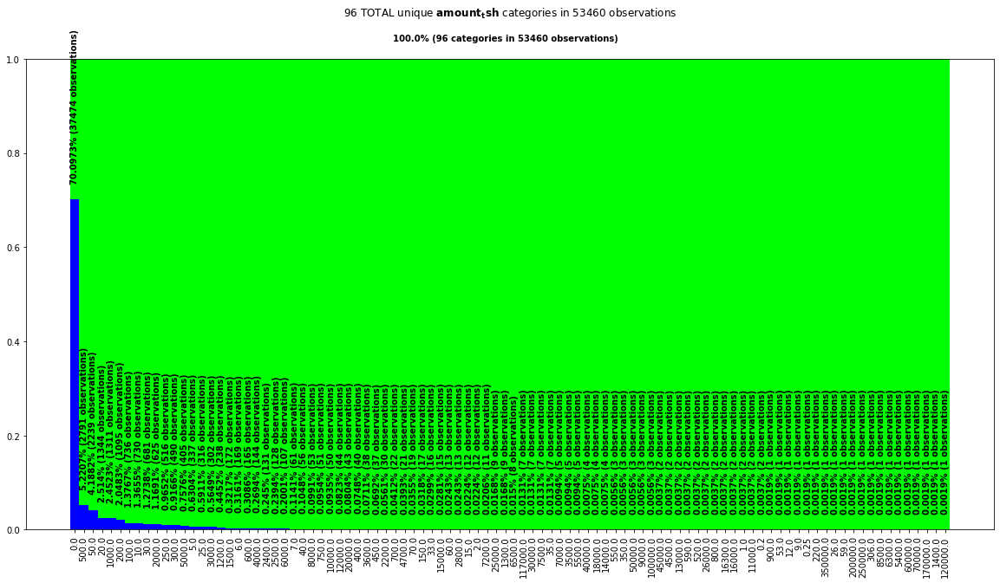

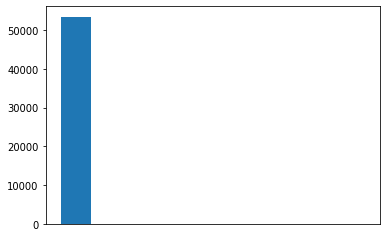

In [51]:
scjpnutils.analyze_categorical_reduction(
    X_train_cont, 
    'X_train_cont', 
    'amount_tsh'
);

From the above, we see that <b>amount_tsh</b> is dominated by the occurrence of value 0, constituting more than 70% of the observations!

According to the description of this feature, <b>amount_tsh</b> is "amount water available to waterpoint".  With 70% of the observations indicating no water is available to the waterpoint, this doesn't seem "right" to me.  We will drop this feature.

In [52]:
cont_feats_to_drop = []
# cont_feats_to_drop.append('amount_tsh')
# feats_to_reintegrate_later.append('amount_tsh')

unexamined_predictors.remove('amount_tsh')

<p><br>
<h4>gps_height:</h4>
<h5>Distribution of value-frequencies</h5>

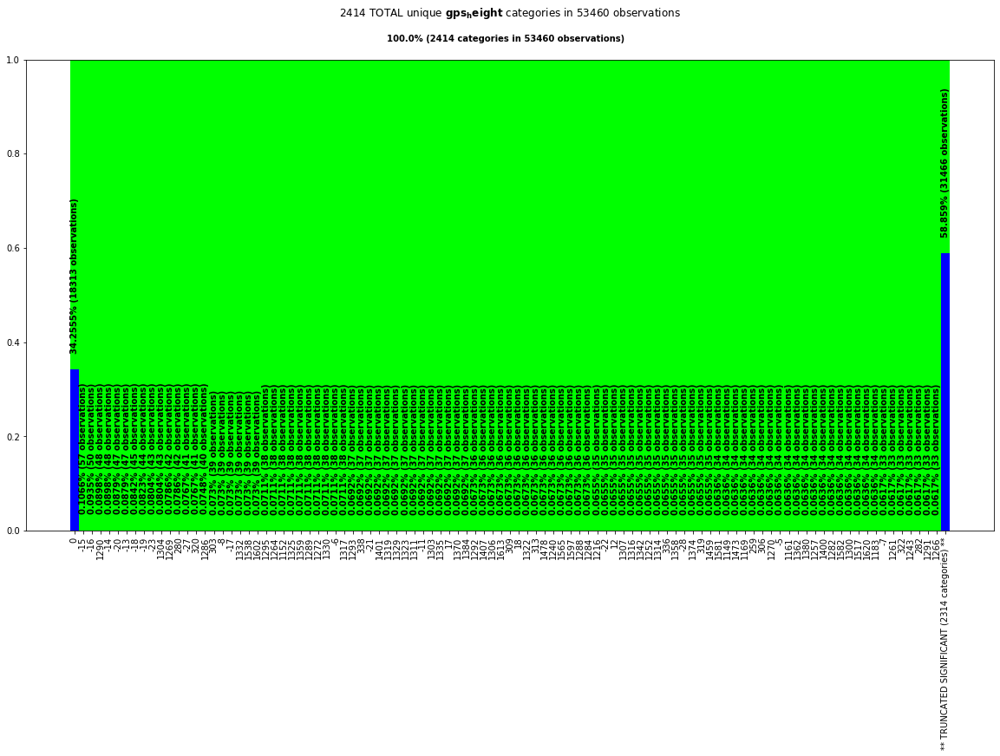

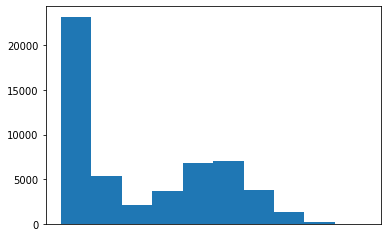

In [53]:
scjpnutils.analyze_categorical_reduction(
    X_train_cont, 
    'X_train_cont', 
    'gps_height'
);

From the above, we see that <b>gps_height</b> does not appear to be serverely dominated by the occurrence of value 0.  But, for the sake of completeness, we will similiarly consider the following cases:

<ol>
    <li>Consider value 0 meaningful</li>
    <li>Consider value 0 a "mistake" in the data</li>
</ol>

<p><br>
<h5>Outliers: Case 1 (consider value 0 meaningful)</h5>

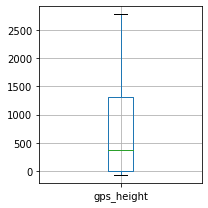

In [54]:
scjpnutils.analyze_outliers_detailed(
    X_train_cont, 
    'X_train_cont', 
    'gps_height', 
    top_percentile=90, 
    outlier_ratio_reduction_threshold=.10
);

Since there are no outlier values and gps_height is not dominated by any one value, it is probably pointless to not consider 0 meangingful.  But for the sake of thorough, we follow the same pattern just to see if we spot any glaring justification to indicate a 0-value is a mistake.

<p><br>
<h5>Outliers: Case 2 (consider value 0 a "mistake" in the data)</h5>

To analyze this case, we need to first execute a replacement strategy on all obervations where <b>gps_height</b>==0, specifically: <b>first replace 0-values with `np.nan` so that they will be excluded from calculations</b>.

In [55]:
ft_replace_gps_height_0_with_nan = FunctionTransformer(lambda X: scjpnutils.impute_TO_nan(X, 'gps_height', 0), validate=False)
X_train_cont__gps_height_0_as_nan = ft_replace_gps_height_0_with_nan.fit_transform(X_train_cont[['gps_height']])

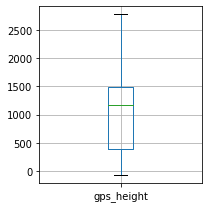

In [56]:
outliers_index, best_gps_height_outlier_replacement_rules, all_gps_height_outlier_replacement_rules = scjpnutils.analyze_outliers_detailed(
    X_train_cont__gps_height_0_as_nan, 
    'X_train_cont__gps_height_0_as_nan', 
    'gps_height', 
    top_percentile=90, 
    outlier_ratio_reduction_threshold=.10
)

What's intersting here is that by considering 0 a "mistake", the mode changes to -15.  After consulting a professional in the industry, it seems that, generally speaking, pumps are below ground at the water-level.  In spite of this, we will accept a 0-valued <b>gps_height</b> as meaningful (not a mistake).  But we will reserve the former insight for future consideration.

In [57]:
unexamined_predictors.remove('gps_height')

<p><br>
<h4>longitude:</h4>
<h5>Distribution of value-frequencies</h5>

In [58]:
# scjpnutils.analyze_categorical_reduction(
#     X_train_cont, 
#     'X_train_cont', 
#     'longitude'
# );

From the above, we see that <b>longitude</b> does not appear to be serverely dominated by the occurrence of value 0 but an exact 0-value for <b>longitude</b> intuitively seems unlikely.

<ol>
    <li>Consider value 0 meaningful</li>
    <li>Consider value 0 a "mistake" in the data</li>
</ol>

<p><br>
<h5>Outliers: Case 1 (consider value 0 meaningful)</h5>

In [59]:
# scjpnutils.analyze_outliers_detailed(
#     X_train_cont, 
#     'X_train_cont', 
#     'longitude', 
#     top_percentile=90, 
#     outlier_ratio_reduction_threshold=.10
# );

The noteable thing here is that the mode of the 90th percentile is 0.  So this is a fairly clear indication this 0 is a "mistake".

<p><br>
<h5>Outliers: Case 2 (consider value 0 a "mistake" in the data)</h5>

To analyze this case, we need to first execute a replacement strategy on all obervations where <b>longitude</b>==0, specifically: <b>first replace 0-values with `np.nan` so that they will be excluded from calculations</b>.

In [60]:
# ft_replace_longitude_0_with_nan = FunctionTransformer(lambda X: scjpnutils.impute_TO_nan(X, 'longitude', 0), validate=False)
# X_train_cont__longitude_0_as_nan = ft_replace_longitude_0_with_nan.fit_transform(X_train_cont[['longitude']])

Now let's have a look at <b>longitude</b> after replacing 0 with `np.nan` above.

In [61]:
# outliers_index, best_longitude_outlier_replacement_rules, all_longitude_outlier_replacement_rules = scjpnutils.analyze_outliers_detailed(
#     X_train_cont__longitude_0_as_nan, 
#     'X_train_cont__longitude_0_as_nan', 
#     'longitude', 
#     top_percentile=90, 
#     outlier_ratio_reduction_threshold=.10
# )

Well that central tendency looks simply beautiful after replacing 0 with `np.nan` (thereby excluding it from calculations).  Additionally, there are no outliers to deal with.  Nice!

This seems like a good strategy so we will commit to doing this:
<ol>
    <li>replace 0-values with <code>np.nan</code> so that they will be excluded from calculations</li>
</ol>

In [62]:
# X_train_cont = ft_replace_longitude_0_with_nan.fit_transform(X_train_cont)

# # add this step to the pipeline
# continuous_transformer.steps.append(['ft_replace_longitude_0_with_nan', ft_replace_longitude_0_with_nan])

In [63]:
# scjpnutils.analyze_outliers_detailed(
#     X_train_cont, 
#     'X_train_cont', 
#     'longitude', 
#     top_percentile=90, 
#     suppress_replacement_strat_analysis=True
# );

In [64]:
# unexamined_predictors.remove('longitude')

<p><br>
<h4>latitude:</h4>
<h5>Distribution of value-frequencies</h5>

In [65]:
# scjpnutils.analyze_categorical_reduction(
#     X_train_cont, 
#     'X_train_cont', 
#     'latitude'
# );

There's nothing out of the ordinary with <b>latitude</b>.  We will leave it as is.

In [66]:
# cont_feats_to_drop.append('latitude')

# unexamined_predictors.remove('latitude')

<p><br>
<h4>num_private:</h4>
<h5>Distribution of value-frequencies</h5>

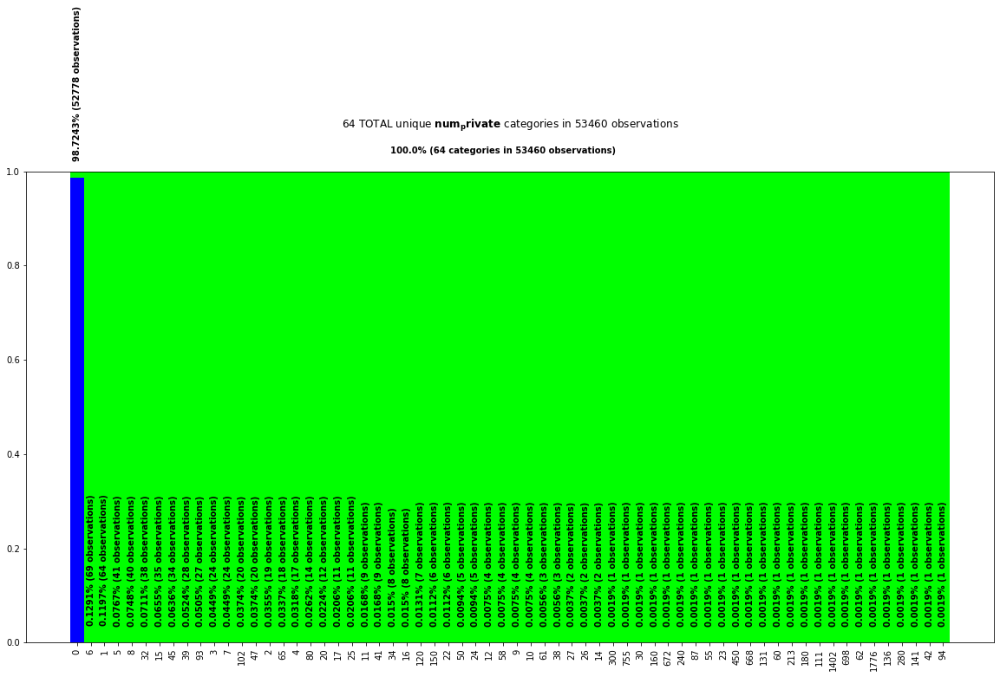

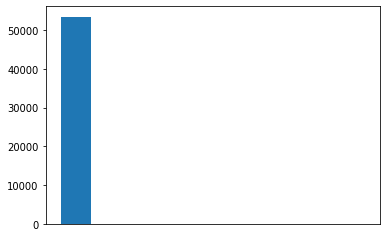

In [67]:
scjpnutils.analyze_categorical_reduction(
    X_train_cont, 
    'X_train_cont', 
    'num_private'
);

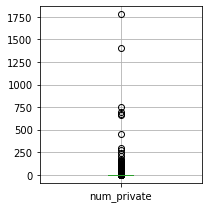

In [68]:
scjpnutils.analyze_outliers_detailed(
    X_train_cont, 
    'X_train_cont', 
    'num_private', 
    top_percentile=90, 
    outlier_ratio_reduction_threshold=.10,
    suppress_replacement_strat_analysis=True
);

Reviewing the above analysis indicates that 1 single value (0) constitutes more than 98% of the population of training observations!  We will <u>drop the <b>num_private</b> feature</u>.

In [69]:
cont_feats_to_drop.append('num_private')
feats_to_reintegrate_later.append('num_private')

unexamined_predictors.remove('num_private')

<p><br>
<h4>population:</h4>
<h5>Distribution of value-frequencies</h5>

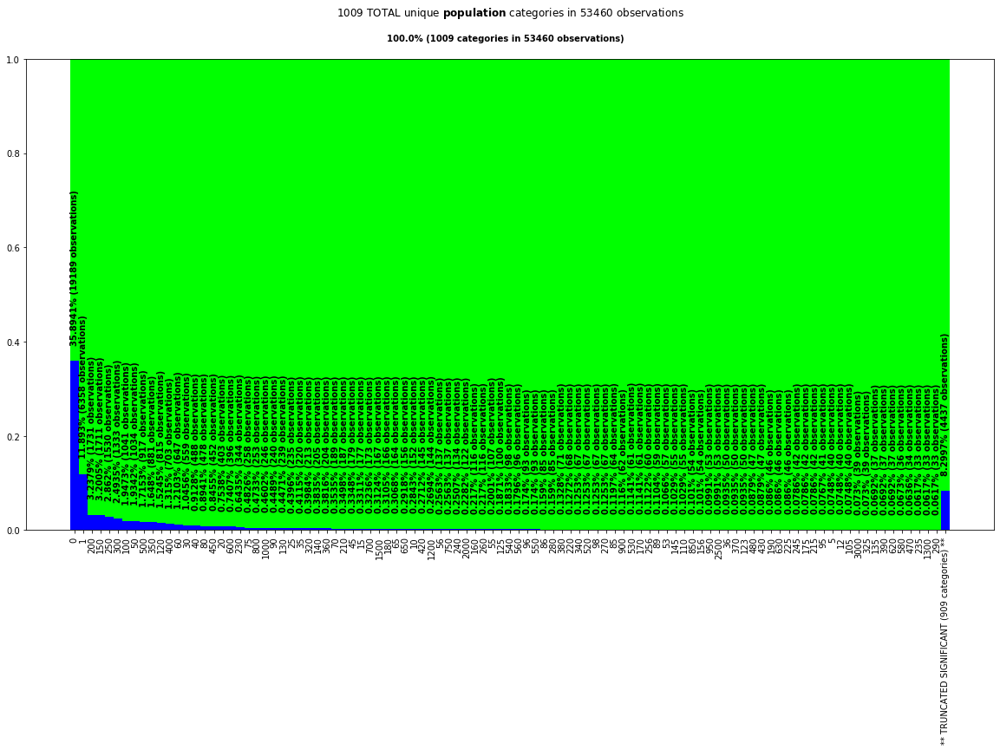

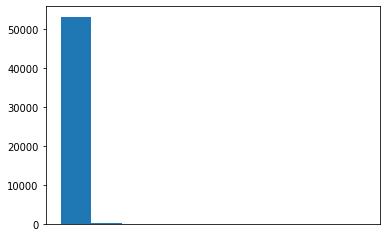

In [70]:
scjpnutils.analyze_categorical_reduction(
    X_train_cont, 
    'X_train_cont', 
    'population'
);

From the above, we see that, similar to <b>amount_tsh</b>, <b>population</b> appears to be dominated by the occurrence of value 0.

Similarly, there are two approaches we can take to deal with this:
<ol>
    <li>Consider value 0 meaningful</li>
    <li>Consider value 0 a "mistake" in the data</li>
</ol>

<p><br>
<h5>Outliers: Case 1 (consider value 0 meaningful)</h5>

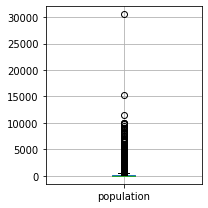

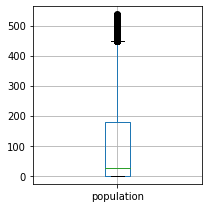

,feature,dtype,q1,q3,IQR_lower_bound,IQR_upper_bound,n_outliers,n_outliers_ratio,outliers_index
0,population,float64,0.0,179.470595,-269.205892,448.676487,1892,0.035391,"Int64Index([23578, 24375, 53123, 54807, 5841,..."


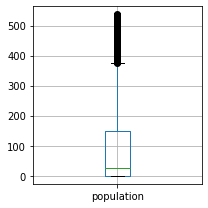

,feature,dtype,q1,q3,IQR_lower_bound,IQR_upper_bound,n_outliers,n_outliers_ratio,outliers_index
0,population,float64,0.0,150.0,-225.0,375.0,3091,0.057819,"Int64Index([46076, 33129, 8247, 23578, 24375,..."


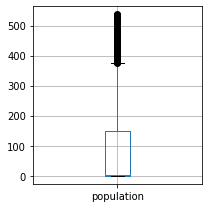

,feature,dtype,q1,q3,IQR_lower_bound,IQR_upper_bound,n_outliers,n_outliers_ratio,outliers_index
0,population,int64,0.0,150.0,-225.0,375.0,3091,0.057819,"Int64Index([46076, 33129, 8247, 23578, 24375,..."


In [71]:
scjpnutils.analyze_outliers_detailed(
    X_train_cont, 
    'X_train_cont', 
    'population', 
    top_percentile=90, 
    outlier_ratio_reduction_threshold=.10
);

Evidently, in the case that a 0-valued <b>population</b> is meaningful, there are supposed wells that serve a 0 <b>population</b>??  That doesn't make sense to me.  Why have a well installed if it is not going to be used?  Additionally, none of the standard replacement strategies seem to be particularly effective in reducing the count of <b>population</b> outliers.


<p><br>
<h5>Outliers: Case 2 (consider value 0 a "mistake" in the data)</h5>

To analyze this case, we need to first execute a replacement strategy on all obervations where <b>population</b>==0, specifically: <b>first replace 0-values with `np.nan` so that they will be excluded from calculations</b>.

In [72]:
ft_replace_population_0_with_nan = FunctionTransformer(lambda X: scjpnutils.impute_TO_nan(X, 'population', 0), validate=False)
X_train_cont__population_0_as_nan = ft_replace_population_0_with_nan.fit_transform(X_train_cont)

Now let's have a look at <b>population</b> after replacing 0 with `np.nan` above.

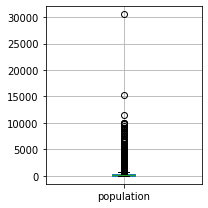

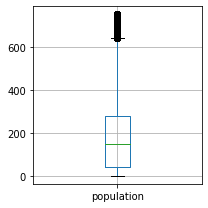

,feature,dtype,q1,q3,IQR_lower_bound,IQR_upper_bound,n_outliers,n_outliers_ratio,outliers_index
0,population,float64,40.0,279.959674,-319.939512,639.899186,709,0.013262,"Int64Index([46319, 5045, 17286, 35708, 36773,..."


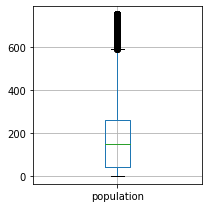

,feature,dtype,q1,q3,IQR_lower_bound,IQR_upper_bound,n_outliers,n_outliers_ratio,outliers_index
0,population,float64,40.0,260.0,-290.0,590.0,1262,0.023606,"Int64Index([46319, 5045, 17286, 10121, 35708,..."


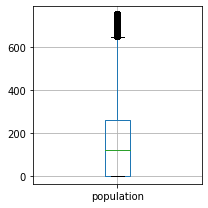

,feature,dtype,q1,q3,IQR_lower_bound,IQR_upper_bound,n_outliers,n_outliers_ratio,outliers_index
0,population,float64,1.0,260.0,-387.5,648.5,684,0.012795,"Int64Index([46319, 5045, 35708, 36773, 8297,..."


In [73]:
outliers_index, best_population_outlier_replacement_rules, all_population_outlier_replacement_rules = scjpnutils.analyze_outliers_detailed(
    X_train_cont__population_0_as_nan, 
    'X_train_cont__population_0_as_nan', 
    'population', 
    top_percentile=90, 
    outlier_ratio_reduction_threshold=.10
)

From the above, we see that <i>if we consider value 0 a mistake in the data</i> then we start off with far fewer outliers - 2081 (out of 47520) observations constituting a ratio of 4.38% - than the case when 0 is considered meaningful! 

Furthermore, we see that <i>with this assumption, executing a replacement strategy (with mean value) will further reduce reduce outlier-count to 507.

This seems like a good strategy so we will commit to doing this:
<ol>
    <li>replace 0-values with <code>np.nan</code> so that they will be excluded from calculations</li>
    <li>replace outliers with mean-value</li>
</ol>

In [74]:
# X_train_cont = ft_replace_population_0_with_nan.fit_transform(X_train_cont)

# # add this step to the pipeline
# continuous_transformer.steps.append(['ft_replace_population_0_with_nan', ft_replace_population_0_with_nan])

In [75]:
# ft_replace_population_outliers_with_mean = FunctionTransformer(
#     lambda X: scjpnutils.replace_outliers(
#         X, 
#         'population', 
#         X_train_cont.population.mean()
#     ), 
#     validate=False
# )

# X_train_cont = ft_replace_population_outliers_with_mean.fit_transform(X_train_cont)

# # add this step to the pipeline
# continuous_transformer.steps.append(['ft_replace_population_outliers_with_mean', ft_replace_population_outliers_with_mean])

In [76]:
# scjpnutils.analyze_outliers_detailed(
#     X_train_cont, 
#     'X_train_cont', 
#     'population', 
#     top_percentile=90, 
#     suppress_replacement_strat_analysis=True
# );

In [77]:
unexamined_predictors.remove('population')

<p><br>
<h4>Now execute the drop in batch</h4>

In [78]:
X_labeled_reintegrate_later = X_labeled[feats_to_reintegrate_later]

dct_cont_predictors_with_bad_outliers = DropColumnsTransformer(cont_feats_to_drop)

X_train_cont = dct_cont_predictors_with_bad_outliers.fit_transform(X_train_cont)

# add this step to the pipeline
continuous_transformer.steps.append(['drop_cont_predictors_with_bad_outliers', dct_cont_predictors_with_bad_outliers])

scjpnutils.analyze_values(X_train_cont, 'X_train_cont (after dropping features with bad outliers)', standard_options_kargs={'sort_unique_vals':True,'hide_cols':True});

,feature,dtype,n_unique,unique_vals
0,amount_tsh,float64,96,"[0.0, 0.2, 0.25, 1.0, 2.0, 5.0, 6.0, 7.0, 9.0,..."
1,gps_height,int64,2414,"[-63, -59, -57, -55, -54, -52, -51, -50, -49, ..."
2,population,int64,1009,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
3,construction_year,int64,55,"[0, 1960, 1961, 1962, 1963, 1964, 1965, 1966, ..."
4,date_recorded,object,354,"[2002-10-14, 2004-01-07, 2004-03-01, 2004-03-0..."


<p><br>
<h4>("New") Feature Engineering: <i>pump_age</i> from <i>date_recorded</i> and <i>construction_year</i></h4>

First, let's have a look at the distribution of unique values of each of those features.

In [79]:
X_train_cont[['date_recorded', 'construction_year']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53460 entries, 44928 to 56422
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   date_recorded      53460 non-null  object
 1   construction_year  53460 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 3.7+ MB


In [80]:
X_train_cont[['date_recorded', 'construction_year']].head()

,date_recorded,construction_year
44928,2012-10-10,0
31178,2013-02-16,2008
9485,2011-03-20,1991
955,2012-10-12,0
29186,2013-02-04,2007


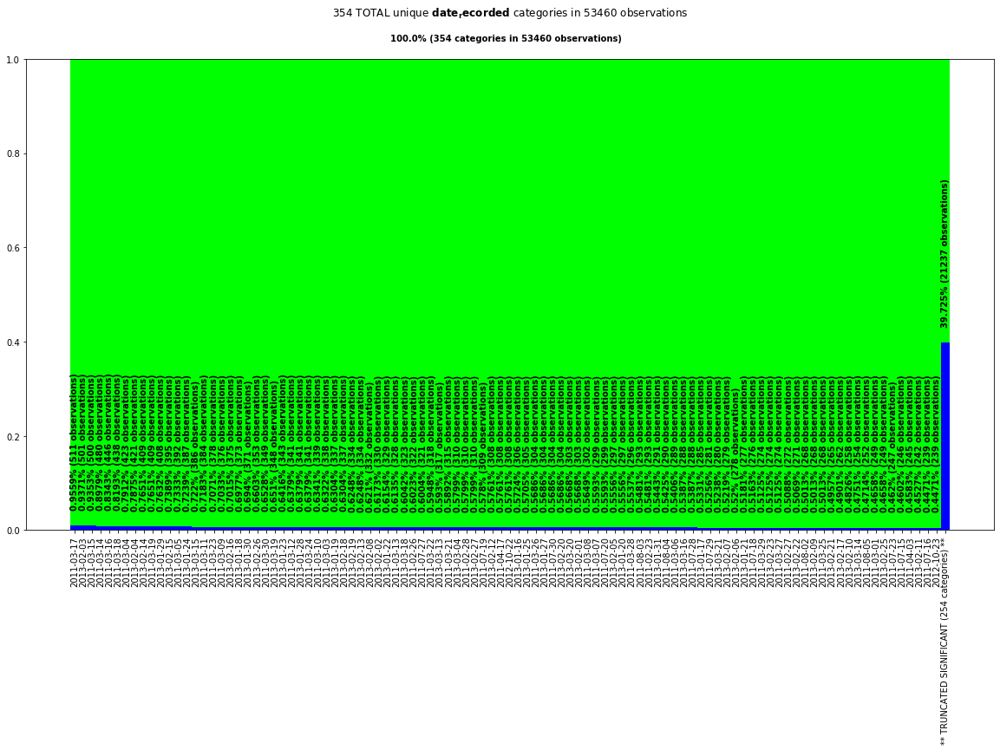

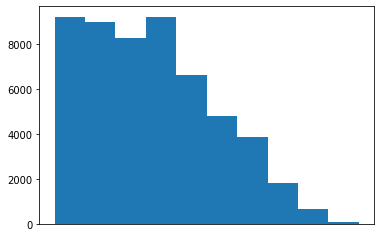

In [81]:
scjpnutils.analyze_categorical_reduction(
    X_train_cont, 
    'X_train_cont', 
    'date_recorded'
);

There is nothing particularly odd about the distribution of <b>date_recorded</b> values.  It is somewhat left-skewed but this is inconsequential.

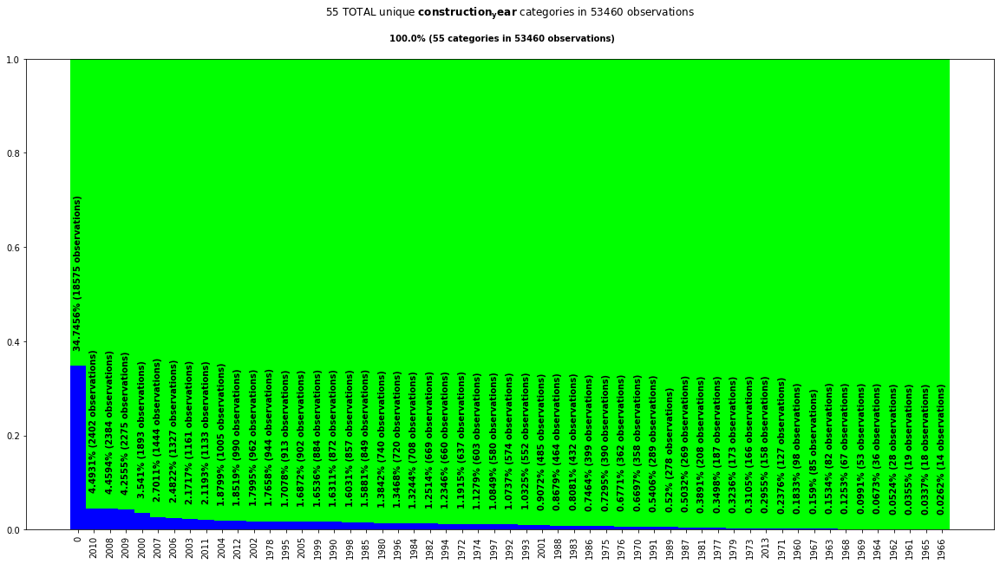

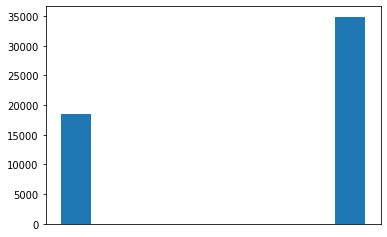

In [82]:
scjpnutils.analyze_categorical_reduction(
    X_train_cont, 
    'X_train_cont', 
    'construction_year'
);

Obviously this distribution is problematic and we need to do something about all of those zeros in <b>construction_year</b>.

While we're at it, let's have a look at the outliers-analysis of <b>construction_year</b> since we already know the frequency of 0 in this distrubution is problematic.

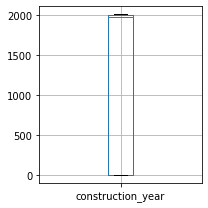

In [83]:
scjpnutils.analyze_outliers_detailed(
    X_train_cont, 
    'X_train_cont', 
    'construction_year', 
    top_percentile=90, 
    outlier_ratio_reduction_threshold=.10
);

At first glance, it seems a good replacement strategy (for 0) would be to use the median of all values (1986).

In [84]:
replace_0_construction_year_rules = {
    'construction_year': [{
        'missing_values': 0, 
        'strategy': 'constant', 
        'fill_value': X_train_cont.construction_year.median()
    }]
}
svt_0_construction_year = SimpleValueTransformer(replace_0_construction_year_rules)

X_train_cont_0_construction_year_clean = svt_0_construction_year.fit_transform(X_train_cont)

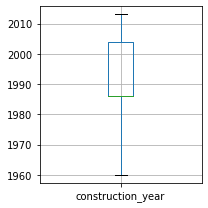

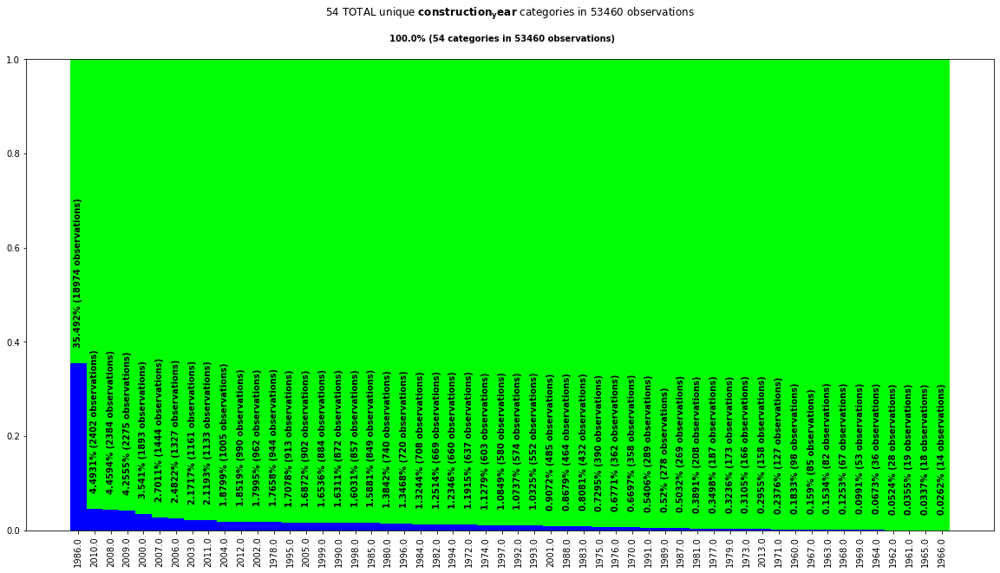

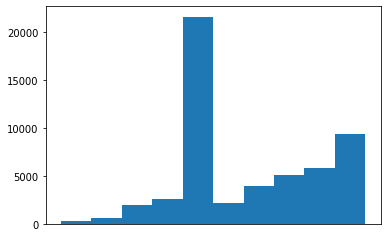

In [85]:
scjpnutils.analyze_outliers_detailed(
    X_train_cont_0_construction_year_clean, 
    'X_train_cont_0_construction_year_clean', 
    'construction_year', 
    top_percentile=90, 
    outlier_ratio_reduction_threshold=.10
);

scjpnutils.analyze_categorical_reduction(
    X_train_cont_0_construction_year_clean, 
    'X_train_cont_0_construction_year_clean', 
    'construction_year'
);

All "0" <b>construction_year</b> have been replaced with the median.  Let's now use this to compute the "new" feature: <b>pump_age</b>.

In [86]:
def add_pump_age_feature(df):
    df__pump_age__debug = df[['date_recorded', 'construction_year']].copy()
    df__pump_age__debug['date_recorded_as_date_dt'] = pd.to_datetime(df__pump_age__debug['date_recorded'], format='%Y-%m-%d')
    df__pump_age__debug['construction_year_as_date_dt'] = pd.to_datetime(df__pump_age__debug['construction_year'], format='%Y')
    df__pump_age__debug['pump_age'] = (df__pump_age__debug['date_recorded_as_date_dt'] - df__pump_age__debug['construction_year_as_date_dt']).dt.days
    df_copy = df.copy()
    df_copy['pump_age'] = df__pump_age__debug['pump_age']
    return df_copy, df__pump_age__debug

X_train__pump_age, X_train__pump_age__debug = add_pump_age_feature(X_train_cont_0_construction_year_clean)

In [87]:
X_train__pump_age.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53460 entries, 44928 to 56422
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   amount_tsh         53460 non-null  float64
 1   gps_height         53460 non-null  int64  
 2   population         53460 non-null  int64  
 3   construction_year  53460 non-null  float64
 4   date_recorded      53460 non-null  object 
 5   pump_age           53460 non-null  int64  
dtypes: float64(2), int64(3), object(1)
memory usage: 2.9+ MB


In [88]:
X_train__pump_age

,amount_tsh,gps_height,population,construction_year,date_recorded,pump_age
44928,0.0,0,0,1986.0,2012-10-10,9779
31178,50.0,-33,1000,2008.0,2013-02-16,1873
9485,0.0,298,1,1991.0,2011-03-20,7383
955,0.0,0,0,1986.0,2012-10-12,9781
29186,5.0,1088,50,2007.0,2013-02-04,2226
...,...,...,...,...,...,...
54343,1000.0,327,255,1995.0,2011-03-20,5922
38158,1000.0,1743,35,1988.0,2011-03-10,8469
860,0.0,-13,1000,2005.0,2011-03-13,2262
15795,0.0,0,0,1986.0,2012-10-31,9800


This looks pretty good.  Let's inspect some statistics.

In [89]:
X_train__pump_age[['pump_age']].describe()

,pump_age
count,53460.000000
mean,7001.597980
std,4109.754529
min,-2405.000000
25%,2973.000000
50%,9199.000000
75%,9781.000000
max,19447.000000


Whoa there!  Apparently we have some pumps with a negative <b>pump_age</b>.  That's not right, is it?  This occurs when <b>date_recorded</b> is before <b>construction_year</b> - the observations in which this occurs are as follows.

In [90]:
X_train__pump_age_neg = X_train__pump_age__debug.query("date_recorded_as_date_dt<construction_year_as_date_dt")
X_train__pump_age_neg

,date_recorded,construction_year,date_recorded_as_date_dt,construction_year_as_date_dt,pump_age
39559,2004-03-06,2009.0,2004-03-06,2009-01-01,-1762
33942,2004-03-01,2007.0,2004-03-01,2007-01-01,-1036
27501,2004-01-07,2009.0,2004-01-07,2009-01-01,-1821
8729,2004-05-01,2008.0,2004-05-01,2008-01-01,-1340
32619,2004-03-01,2005.0,2004-03-01,2005-01-01,-306
13366,2004-06-01,2011.0,2004-06-01,2011-01-01,-2405
23373,2004-03-01,2009.0,2004-03-01,2009-01-01,-1767
48555,2004-12-01,2008.0,2004-12-01,2008-01-01,-1126


There are only a few observations where this occcurs.  It seems reasonable to replace those occurrences with the minimum <b>construction_year</b>.

In [91]:
X_train__pump_age__debug.date_recorded_as_date_dt.min()

Timestamp('2002-10-14 00:00:00')

In [92]:
X_train__pump_age__debug.construction_year_as_date_dt.min()

Timestamp('1960-01-01 00:00:00')

In [93]:
X_train__pump_age_neg.construction_year.unique()

array([2009., 2007., 2008., 2005., 2011.])

In [94]:
replace_cy_where_pa_neg_rules = []
for bad_cy in list(X_train__pump_age_neg.construction_year.unique()):
    replace_cy_where_pa_neg_rules.append({
        'missing_values': bad_cy,
        'strategy': 'constant',
        'fill_value': X_train__pump_age__debug.construction_year.min()
    })
replace_cy_where_pa_neg_rules = {'construction_year': replace_cy_where_pa_neg_rules}
svt_neg_pump_age = SimpleValueTransformer(replace_cy_where_pa_neg_rules)

X_train__pump_age__debug_clean = svt_neg_pump_age.fit_transform(X_train__pump_age__debug) # gives us back a DF with bad cy's replaced

In [95]:
X_train__pump_age_clean, _ = add_pump_age_feature(X_train__pump_age__debug_clean)
X_train__pump_age_clean[['pump_age']].describe()

,pump_age
count,53460.000000
mean,9680.892480
std,5230.499172
min,2.000000
25%,5927.000000
50%,9336.000000
75%,11393.000000
max,19695.000000


This looks MUCH better.  But we need to update our `add_pump_age_feature` function to carry out the above step as well and then create a `FunctionTransformer` to apply it to `X_train_cont`.

In [96]:
def add_pump_age_feature(df):
    df_copy = df.copy()

    # remember that the first part of this process requires that we first replace 0 construction_year with median
    replace_0_construction_year_rules = {
        'construction_year': [{
            'missing_values': 0, 
            'strategy': 'constant', 
            'fill_value': df_copy.construction_year.median()
        }]
    }
    svt_0_construction_year = SimpleValueTransformer(replace_0_construction_year_rules)
    df_copy = svt_0_construction_year.fit_transform(df_copy)

    # create DateTime versions of date_recorded and construction_year so we can do date-math
    df__pump_age__debug = df_copy[['date_recorded', 'construction_year']].copy()
    df__pump_age__debug['date_recorded_as_date_dt'] = pd.to_datetime(df__pump_age__debug['date_recorded'], format='%Y-%m-%d')
    df__pump_age__debug['construction_year_as_date_dt'] = pd.to_datetime(df__pump_age__debug['construction_year'], format='%Y') # we can use df_copy construction_year now since bad values have been replaced
    df__pump_age__debug['pump_age'] = (df__pump_age__debug['date_recorded_as_date_dt'] - df__pump_age__debug['construction_year_as_date_dt']).dt.days

    df_debug__pump_age_neg = df__pump_age__debug.query("date_recorded_as_date_dt<construction_year_as_date_dt")
    replace_cy_where_pa_neg_rules = []
    for bad_cy in list(df_debug__pump_age_neg.construction_year.unique()):
        replace_cy_where_pa_neg_rules.append({
            'missing_values': bad_cy,
            'strategy': 'constant',
            'fill_value': df_copy.construction_year.min() # we can use df_copy construction_year now since bad values have been replaced
        })
    replace_cy_where_pa_neg_rules = {'construction_year': replace_cy_where_pa_neg_rules}
    svt_neg_pump_age = SimpleValueTransformer(replace_cy_where_pa_neg_rules)
    df_with_bad_cy_replaced = svt_neg_pump_age.fit_transform(df_copy)

    # recompute
    df__pump_age__debug = df_with_bad_cy_replaced[['date_recorded', 'construction_year']].copy()
    df__pump_age__debug['date_recorded_as_date_dt'] = pd.to_datetime(df__pump_age__debug['date_recorded'], format='%Y-%m-%d')
    df__pump_age__debug['construction_year_as_date_dt'] = pd.to_datetime(df__pump_age__debug['construction_year'], format='%Y')
    df__pump_age__debug['pump_age'] = (df__pump_age__debug['date_recorded_as_date_dt'] - df__pump_age__debug['construction_year_as_date_dt']).dt.days

    df_copy['pump_age'] = df__pump_age__debug['pump_age']

    return df_copy

In [97]:
ft_add_pump_age_feature = FunctionTransformer(lambda X: add_pump_age_feature(X), validate=False)
X_train_cont = ft_add_pump_age_feature.fit_transform(X_train_cont)

# add this step to the pipeline
continuous_transformer.steps.append(['ft_add_pump_age_feature', ft_add_pump_age_feature])

In [98]:
X_train_cont[['pump_age']].describe()

,pump_age
count,53460.000000
mean,9680.892480
std,5230.499172
min,2.000000
25%,5927.000000
50%,9336.000000
75%,11393.000000
max,19695.000000


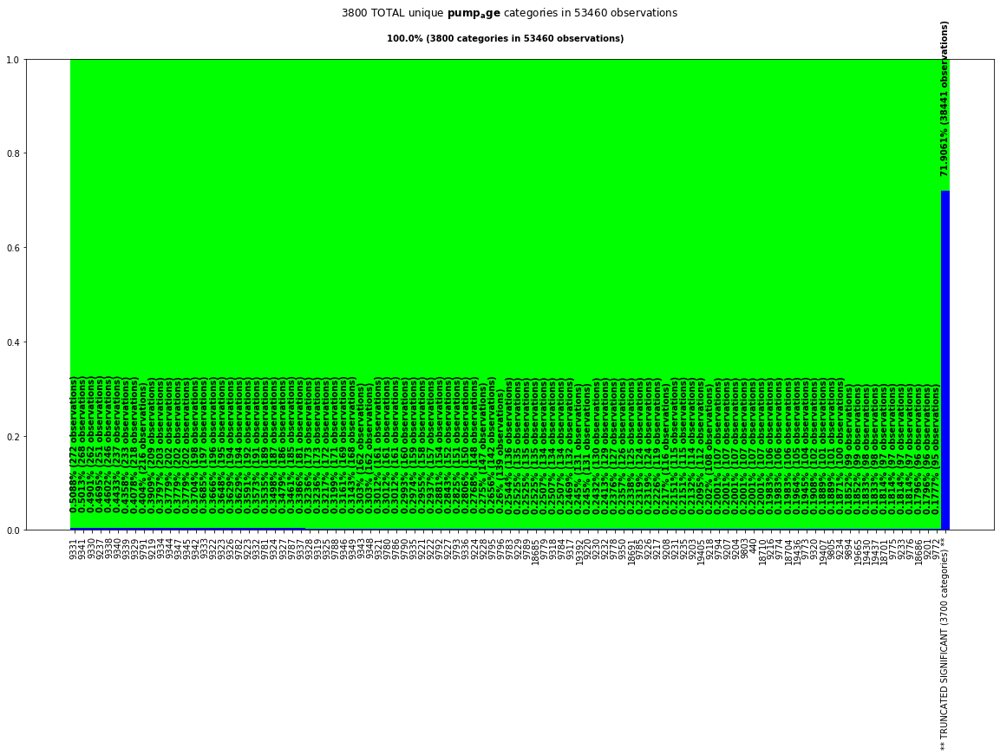

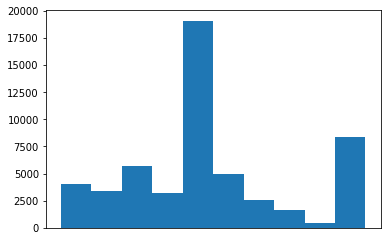

In [99]:
scjpnutils.analyze_categorical_reduction(
    X_train_cont, 
    'X_train_cont', 
    'pump_age'
);

The last thing to do here is drop both <b>date_recorded</b> and <b>construction_year</b> columns since they were only there so that the <b>pump_age_days</b> feature could be created.

In [100]:
feats_to_reintegrate_later.extend(pump_age_feats)
X_labeled_reintegrate_later = X_labeled[feats_to_reintegrate_later]

dct_pump_age_feats = DropColumnsTransformer(pump_age_feats)
X_train_cont = dct_pump_age_feats.fit_transform(X_train_cont)

# add this step to the pipeline
continuous_transformer.steps.append(['dct_pump_age_feats', dct_pump_age_feats])

This leaves us with our final form of train continuous predictors, ready for scaling.

In [101]:
scjpnutils.analyze_values(X_train_cont, 'X_train_cont', standard_options_kargs={'sort_unique_vals':True,'hide_cols':True});

,feature,dtype,n_unique,unique_vals
0,amount_tsh,float64,96,"[0.0, 0.2, 0.25, 1.0, 2.0, 5.0, 6.0, 7.0, 9.0,..."
1,gps_height,int64,2414,"[-63, -59, -57, -55, -54, -52, -51, -50, -49, ..."
2,population,int64,1009,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
3,pump_age,int64,3800,"[2, 15, 16, 26, 29, 32, 33, 34, 35, 37, 38, 42..."


<p><br>
<h4>Scale</h4>

In [102]:
final_cont_feats = list(X_train_cont.columns)

In [103]:
scaler = MinMaxScaler()

scaled_X_train_cont = pd.DataFrame(scaler.fit_transform(X_train_cont), columns=X_train_cont.columns, index=X_train_cont.index)
scaled_X_train_cont.describe()

# add this step to the pipeline
continuous_transformer.steps.append(['scaler', scaler])

In [104]:
scaled_X_train_cont.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53460 entries, 44928 to 56422
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   amount_tsh  53460 non-null  float64
 1   gps_height  53460 non-null  float64
 2   population  53460 non-null  float64
 3   pump_age    53460 non-null  float64
dtypes: float64(4)
memory usage: 2.0 MB


In [105]:
scaled_X_train_cont.describe()

,amount_tsh,gps_height,population,pump_age
count,53460.000000,53460.000000,53460.000000,53460.000000
mean,0.000904,0.258423,0.005884,0.491489
std,0.008711,0.244636,0.015391,0.265602
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.022238,0.000000,0.300868
50%,0.000000,0.153194,0.000820,0.473976
75%,0.000057,0.488175,0.007049,0.578429
max,1.000000,1.000000,1.000000,1.000000


<p><br><br>
<h3>Identify and Prepare CATEGORICAL Features (for One-Hot Encoding)</h3>
Like we did for Continuous feature preprocessing, we'll initialize a new corresponding `Pipeline` in order to house the steps.

In [106]:
# Categorical
categorical_transformer = Pipeline(steps=[('data_cleaner', data_cleaner)])

In [107]:
dct_cat_predictors_from_cont_predictors = DropColumnsTransformer(cont_feats + pump_age_feats + cont_feats_to_drop)

X_train_cat = dct_cat_predictors_from_cont_predictors.fit_transform(X_train)
# do the same for "throw-away" version of X_unlabeled and X_test since we will use union of unique categories between them for one-hot encoding
X_unlabeled_cat_throw_away = dct_cat_predictors_from_cont_predictors.fit_transform(X_unlabeled_throw_away)
X_test_cat_throw_away = dct_cat_predictors_from_cont_predictors.fit_transform(X_test)

# add this step to the pipeline
categorical_transformer.steps.append(['dct_cat_predictors_from_cont_predictors', dct_cat_predictors_from_cont_predictors])

X_train_cat.info()

cat_feats = list(X_train_cat.columns)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53460 entries, 44928 to 56422
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   installer              53460 non-null  object
 1   basin                  53460 non-null  object
 2   ward                   53460 non-null  object
 3   public_meeting         53460 non-null  bool  
 4   scheme_management      53460 non-null  object
 5   scheme_name            53460 non-null  object
 6   permit                 53460 non-null  bool  
 7   extraction_type_class  53460 non-null  object
 8   management_group       53460 non-null  object
 9   payment_type           53460 non-null  object
 10  quality_group          53460 non-null  object
 11  quantity               53460 non-null  object
 12  source                 53460 non-null  object
 13  waterpoint_type        53460 non-null  object
dtypes: bool(2), object(12)
memory usage: 7.9+ MB


<p><br>
<h4>High-level Overview</h4>

In [108]:
scjpnutils.analyze_values(
    X_train_cat, 
    'X_train_cat', 
    standard_options_kargs={'sort_unique_vals':True,'hide_cols':True}
);

,feature,dtype,n_unique,unique_vals
0,installer,object,2037,"[-, 0, A.D.B, AAR, ABASIA, ABD, ABDALA, ABDUL,..."
1,basin,object,9,"[Internal, Lake Nyasa, Lake Rukwa, Lake Tangan..."
2,ward,object,2089,"[Aghondi, Akheri, Arash, Arri, Arusha Chini, B..."
3,public_meeting,bool,2,"[False, True]"
4,scheme_management,object,12,"[Company, None, Other, Parastatal, Private ope..."
5,scheme_name,object,2628,"[14 Kambarage, A, ADP, ADP Simbo, ADP Simbu, A..."
6,permit,bool,2,"[False, True]"
7,extraction_type_class,object,7,"[gravity, handpump, motorpump, other, rope pum..."
8,management_group,object,5,"[commercial, other, parastatal, unknown, user-..."
9,payment_type,object,7,"[annually, monthly, never pay, on failure, oth..."


Observations from the above:
<ul>
    <li>First, our goal is to produce a minimal set of categories in each feature without losing much information - this is because we will ultimately be One-Hot Encoding these features after "manual" MCA process is complete.</li>
    <li><b>installer</b>, <b>basin</b>, <b>scheme_management</b>, and <b></b> features have mixed-case values; by normalizing all object (string) categorical features to lower-case, we will remove some duplicates that differ only by their case.</li>
    <li>So far, <b>installer</b> appears to have some non-sensical category values - for this purpose, with the exception of the "0" installer above (probably should be "none"), we ought to replace non-alphanumeric (e.g. punctuation) characters, as well as white-space, with some column-name-friendly value (e.g. "_") since these categories will ultimately end up being column names after they are One-Hot Encoded.</li>
</ul>

<h4>"Manual" MCA: Check for Duplication after Normalizing to Lowercase</h4>

Inspect dataframe summary after normalizing to lower-case and compare to the one above (in the High-level Overview).

In [109]:
feats_with_ucase = []
for feat in list(X_train_cat.select_dtypes('object').columns):
    X_train_cat_feat_with_ucase_vals = X_train_cat.loc[X_train_cat[feat].str.contains('[A-Z]+',regex=True)==True]
    if len(X_train_cat_feat_with_ucase_vals) > 0:
        feats_with_ucase.append(feat)

scjpnutils.analyze_values(
    X_train_cat[feats_with_ucase], 
    'X_train_cat: BEFORE normalizing to lower-case', 
    standard_options_kargs={'sort_unique_vals':True,'hide_cols':True}
);

,feature,dtype,n_unique,unique_vals
0,installer,object,2037,"[-, 0, A.D.B, AAR, ABASIA, ABD, ABDALA, ABDUL,..."
1,basin,object,9,"[Internal, Lake Nyasa, Lake Rukwa, Lake Tangan..."
2,ward,object,2089,"[Aghondi, Akheri, Arash, Arri, Arusha Chini, B..."
3,scheme_management,object,12,"[Company, None, Other, Parastatal, Private ope..."
4,scheme_name,object,2628,"[14 Kambarage, A, ADP, ADP Simbo, ADP Simbu, A..."


In [110]:
scjpnutils.analyze_values(
    X_train_cat[feats_with_ucase], 
    'X_train_cat: AFTER normalizing to lower-case',  
    standard_options_kargs={'sort_unique_vals':True,'normalize_lcase':True,'hide_cols':True}
);

,feature,dtype,n_unique,unique_vals
0,installer,object,1845,"[-, 0, a.d.b, aar, aartisa, abasia, abd, abdal..."
1,basin,object,9,"[internal, lake nyasa, lake rukwa, lake tangan..."
2,ward,object,2089,"[aghondi, akheri, arash, arri, arusha chini, b..."
3,scheme_management,object,12,"[company, none, other, parastatal, private ope..."
4,scheme_name,object,2515,"[14 kambarage, a, adp, adp simbo, adp simbu, a..."


We see that <b>installer</b> and <b>scheme_name</b> both have fewer unique values when normalized to lower-case string values.  The set of unique <b>basin</b> feature-values remains unchanaged before/after lcase normalization.  But just to be sure, we will normalize ALL categorical features to lower-case.

<p><br>
<h4>"Manual" MCA: Normalize feature-values (strings) to lower-case</h4>

In [111]:
def impute_lcase(df):
    feats_with_ucase = []
    for feat in list(df.select_dtypes('object').columns):
        df_feat_with_ucase_vals = df.loc[df[feat].str.contains('[A-Z]+',regex=True)==True]
        if len(df_feat_with_ucase_vals) > 0:
            feats_with_ucase.append(feat)
    impute_lcase_rules = {}
    for feat_with_ucase in feats_with_ucase:
        impute_lcase_rules[feat_with_ucase] = lambda v: v.lower()
    lt_lcase_cat_predictors = LambdaTransformer(impute_lcase_rules)
    return lt_lcase_cat_predictors.fit_transform(df)

ft_impute_lcase = FunctionTransformer(lambda X: impute_lcase(X), validate=False)
X_train_cat = ft_impute_lcase.fit_transform(X_train_cat)

# do the same for "throw-away" version of X_unlabeled and X_test since we will use union of unique categories between them for one-hot encoding
X_unlabeled_cat_throw_away = ft_impute_lcase.fit_transform(X_unlabeled_cat_throw_away)
X_test_cat_throw_away = ft_impute_lcase.fit_transform(X_test_cat_throw_away)

# add this step to the pipeline
categorical_transformer.steps.append(['ft_impute_lcase', ft_impute_lcase])

<p><br>
<h4>"Manual" MCA: Check for Non-Alphanumeric Strings</h4>

In [112]:
scjpnutils.analyze_non_alphanumeric_strings(X_train_cat, 'X_train_cat');

,feature,n_unique,n_non_alphanumeric_str,non_alphanumeric_str_index
0,installer,1845,8627,"Int64Index([22395, 43915, 8247, 40466, 22397,..."
1,basin,9,31242,"Int64Index([31178, 955, 11376, 41084, 29574,..."
2,ward,2089,5158,"Int64Index([44928, 55255, 54002, 41664, 12544,..."
4,scheme_management,12,6274,"Int64Index([44928, 29186, 35970, 5045, 54002,..."
5,scheme_name,2515,16696,"Int64Index([44928, 31178, 29186, 46076, 46319,..."
7,extraction_type_class,7,511,"Int64Index([32212, 15460, 33454, 44737, 27010,..."
8,management_group,5,47258,"Int64Index([31178, 9485, 955, 29186, 46076,..."
9,payment_type,7,34495,"Int64Index([44928, 31178, 9485, 955, 29186,..."
10,quality_group,6,0,None
11,quantity,5,0,None


Since we ultimately plan to one-hot encode these values, it is clear we must now deal with strings containing white-space as well as non-alphanumeric characters.

We'll start by first removing whitespace.

<p><br>
<h4>"Manual" MCA: Remove Whitespace</h4>

In [113]:
strip_ws = {}
for cat_feat in cat_feats:
    strip_ws[cat_feat] = lambda v: re.sub('\s+','',v)
lt_strip_ws_cat_predictors = LambdaTransformer(strip_ws)

X_train_cat = lt_strip_ws_cat_predictors.fit_transform(X_train_cat)

# do the same for "throw-away" version of X_unlabeled and X_test since we will use union of unique categories between them for one-hot encoding
X_unlabeled_cat_throw_away = lt_strip_ws_cat_predictors.fit_transform(X_unlabeled_cat_throw_away)
X_test_cat_throw_away = lt_strip_ws_cat_predictors.fit_transform(X_test_cat_throw_away)

# add this step to the pipeline
categorical_transformer.steps.append(['lt_strip_ws_cat_predictors', lt_strip_ws_cat_predictors])

Now replace remaining non-alphanumeric characters with "\_".  Note that we might lose some information of single-character categories since every one of them will now map to the single "\_" category.

<p><br>
<h4>"Manual" MCA: Replace Non-alphanumeric</h4>

In [114]:
replace_non_alphanumeric = {}
for cat_feat in cat_feats:
    replace_non_alphanumeric[cat_feat] = lambda v: re.sub('[^a-zA-Z0-9]','_',v)
lt_replace_non_alphanumeric_cat_predictors = LambdaTransformer(replace_non_alphanumeric)

X_train_cat = lt_replace_non_alphanumeric_cat_predictors.fit_transform(X_train_cat)

# do the same for "throw-away" version of X_unlabeled and X_test since we will use union of unique categories between them for one-hot encoding
X_unlabeled_cat_throw_away = lt_replace_non_alphanumeric_cat_predictors.fit_transform(X_unlabeled_cat_throw_away)
X_test_cat_throw_away = lt_replace_non_alphanumeric_cat_predictors.fit_transform(X_test_cat_throw_away)

# add this step to the pipeline
categorical_transformer.steps.append(['lt_replace_non_alphanumeric_cat_predictors', lt_replace_non_alphanumeric_cat_predictors])

Now let's analyze the values of the result (for uniqueness).  We should be close to our final set of categories of each (categorical) feature.

In [115]:
str_feat_unique_nonalphabetic_string_vals, df_nonalphanumeric_analysis = scjpnutils.analyze_non_alphanumeric_strings(X_train_cat, 'X_train_cat')
df_values_analysis, _ = scjpnutils.analyze_values(X_train_cat, 'X_train_cat', standard_options_kargs={'sort_unique_vals':True,'hide_cols':True})

,feature,n_unique,n_non_alphanumeric_str,non_alphanumeric_str_index
0,installer,1789,1399,"Int64Index([13745, 4040, 4348, 20650, 16247,..."
1,basin,9,9452,"Int64Index([31178, 29574, 466, 42516, 24889,..."
2,ward,2087,1059,"Int64Index([55255, 41664, 17231, 51239, 7417,..."
4,scheme_management,12,0,None
5,scheme_name,2442,1702,"Int64Index([41664, 15033, 26615, 38296, 40626,..."
7,extraction_type_class,7,102,"Int64Index([32212, 15460, 14299, 10595, 36924,..."
8,management_group,5,47258,"Int64Index([31178, 9485, 955, 29186, 46076,..."
9,payment_type,7,0,None
10,quality_group,6,0,None
11,quantity,5,0,None


,feature,dtype,n_unique,unique_vals
0,installer,object,1789,"[0, _, a_d_b, aar, aartisa, abasia, abd, abdal..."
1,basin,object,9,"[internal, lakenyasa, lakerukwa, laketanganyik..."
2,ward,object,2087,"[aghondi, akheri, arash, arri, arushachini, ba..."
3,public_meeting,bool,2,"[False, True]"
4,scheme_management,object,12,"[company, none, other, parastatal, privateoper..."
5,scheme_name,object,2442,"[14kambarage, a, adp, adpsimbo, adpsimbu, adra..."
6,permit,bool,2,"[False, True]"
7,extraction_type_class,object,7,"[gravity, handpump, motorpump, other, ropepump..."
8,management_group,object,5,"[commercial, other, parastatal, unknown, user_..."
9,payment_type,object,7,"[annually, monthly, neverpay, onfailure, other..."


There are a couple of things to note, here.

First, both <b>installer</b> and <b>scheme_name</b> still have A LOT of categories.  We ought to try to reduce the set of unique categories in each since One-Hot encoding will convert each category into a new column.

Notice that <b>installer</b> seems to contain "weird" values :"0" and "_".  We should officially search for so-called "weird" values and map them to the "unknown" <b>installer</b>.

<p><br>
<h4>"Manual" MCA: Map so-called "weird" resulting categories - e.g. map <i>installer</i> categories "0" and "_" to "unknown"</h4>

In [116]:
scjpnutils.find_weird_vals(X_train_cat, 'X_train_cat', regx_weird_val=r"\b[^a-zA-Z]+\b", suppress_output=False);

installer:
	'0' is weird (according to weird-value regex: '\b[^a-zA-Z]+\b')
	'_' is weird (according to weird-value regex: '\b[^a-zA-Z]+\b')



In [117]:
def replace_weird_category_values(df, regx_weird_val, map_to):
    weird_vals_map = scjpnutils.find_weird_vals(df, '', regx_weird_val=regx_weird_val, suppress_output=True)
    replace_weird_categories_rules = {}
    for feat, weird_vals in weird_vals_map.items():
        _replace_weird_categories_rules = []
        for weird_val in weird_vals:
            _replace_weird_categories_rules.append({
                'missing_values': weird_val,
                'strategy': 'constant',
                'fill_value': map_to
            })
        replace_weird_categories_rules[feat] = _replace_weird_categories_rules
    svt_weird_categories = SimpleValueTransformer(replace_weird_categories_rules)
    return svt_weird_categories.fit_transform(df)

# note that our definition of "weird" here is given by r"\b[^a-zA-Z]+\b" - i.e. categories that are strictly not alphabetic as a whole word - this captures, for example, "0" and "_" categories; other examples of weird values this would capture are "1234" and "__" (but these are not confirmed to have appeared)
ft_replace_weird_category_values = FunctionTransformer(lambda X: replace_weird_category_values(X, r"\b[^a-zA-Z]+\b", 'unknown'), validate=False)
X_train_cat = ft_replace_weird_category_values.fit_transform(X_train_cat)

# do the same for "throw-away" version of X_unlabeled and X_test since we will use union of unique categories between them for one-hot encoding
X_unlabeled_cat_throw_away = ft_replace_weird_category_values.fit_transform(X_unlabeled_cat_throw_away)
X_test_cat_throw_away = ft_replace_weird_category_values.fit_transform(X_test_cat_throw_away)

# add this step to the pipeline
categorical_transformer.steps.append(['ft_replace_weird_category_values', ft_replace_weird_category_values])

In [118]:
scjpnutils.analyze_values(X_train_cat, 'X_train_cat', standard_options_kargs={'sort_unique_vals':True,'hide_cols':True});

,feature,dtype,n_unique,unique_vals
0,installer,object,1787,"[a_d_b, aar, aartisa, abasia, abd, abdala, abd..."
1,basin,object,9,"[internal, lakenyasa, lakerukwa, laketanganyik..."
2,ward,object,2087,"[aghondi, akheri, arash, arri, arushachini, ba..."
3,public_meeting,bool,2,"[False, True]"
4,scheme_management,object,12,"[company, none, other, parastatal, privateoper..."
5,scheme_name,object,2442,"[14kambarage, a, adp, adpsimbo, adpsimbu, adra..."
6,permit,bool,2,"[False, True]"
7,extraction_type_class,object,7,"[gravity, handpump, motorpump, other, ropepump..."
8,management_group,object,5,"[commercial, other, parastatal, unknown, user_..."
9,payment_type,object,7,"[annually, monthly, neverpay, onfailure, other..."


We see above that we still have MANY categories for both <b>installer</b> and <b>scheme_name</b> features. 

Let's see if we can find a suitable (smaller) list of unique categories that represent major portions of the population of observations for each of those features, without losing too much information.  If we can capture a major portion of the population of total observations the idea will be to map the remainder to 'other' or some other suitable category (without losing much information).

<p><br>
<h4>"Manual" MCA: Categories-Magnitude Reduction Analysis for features with MANY categories: <i>installer</i> and <i>scheme_name</i></h4>
<h5>installer</h5>

First, let's do some "duplicates" analysis based on the first `n` letters.  The idea is to find the "sweet spot" for `n` whereby different values were inadvertently entered while intending identification with only one.

In [119]:
scjpnutils.minimize_loss__first_n_chars_reduction(
    X_train_cat, 
    'X_train_cat', 
    'installer', 
    target_first_n_chars__start=10, 
    target_first_n_chars__stop=4,
    verbose=False
);

In spite of the warnings of lost information, let's look further into the first-5 letters of <b>installer</b> replacement scheme.

In [120]:
X_train_cat_installer_abbrev_replacement_candidate, _, _, _ = scjpnutils.reduce_unique__first_n_chars(
    X_train_cat, 
    'X_train_cat', 
    'installer', 
    target_first_n_chars=5,
    suppress_output=False
)

,installers,n_installers
installer_abbrev,,
abdal,"[abdala, abdallahallywazir]",2
actio,"[actionaid, actioncontrelafaim]",2
activ,"[activemkm, activekmk, activetankco, activetankcoltd]",4
adra_,"[adra_community, adra_government]",2
afric,"[africaaminialama, africa, africamuslimagenc, africare, africanmuslimsage, africaislamicagencytanzania, africanrealiefcommitteofku, africandevelopmentfoundation, africaone, africam, africamuslim, africanreflectionsfoundation, africaoneltd]",13
ampco,"[ampcontracts, ampcontractor, ampcontract]",3
angli,"[angli, anglicanchurch, anglicachurch, anglicanuganda, anglikana, anglikan, anglikanachurch, anglican]",8
aquaw,"[aquawel, aquawat]",2
ardhi,"[ardhiwaterwell, ardhiinstute, ardhiwaterwells, ardhiandpetcompanies]",4


The first 5 letters of the majority of cases do well to represent each category - i.e. in those cases, installer categories do indeed look like they were duplicated or misspelled and this strategy cleans up those cases rather well.

So, the bottom line is that we will commit to using this replacement strategy for <b>installer</b>.

Also note that there are some special values that were previously missed that have been caught by the above analysis:
<ul>
    <li>represented by <b>notkn</b> abbrev: [notknown, notkno]</li>
    <li>represented by <b>unkno</b> abbrev: [unknown, unknowninstaller]</li>
</ul>

Let's see how many observations of each of those in the candidate replacement dataset there are.

In [121]:
len(X_train_cat_installer_abbrev_replacement_candidate.query("installer=='notkn'"))

38

In [122]:
len(X_train_cat_installer_abbrev_replacement_candidate.query("installer=='unkno'"))

719

That's actually quite a bit.  After we commit the above replacement strategy, we need to normalize new installer categories <b>notkn</b> and <b>unkno</b> to <b>unknown</b> since we will be executing a futher reduction based on "significance" later wherein we will replace so-called "insignificant" (but known) installers with new category <b>other</b>.

But first, let's commit the abbreviation replacement strategy to the `Pipeline`.

In [123]:
ft_replace_installer_with_optimal_abbrev = FunctionTransformer(
    lambda X: scjpnutils.reduce_unique__first_n_chars(
        X, 
        '', 
        'installer', 
        target_first_n_chars=5,
        suppress_output=True
    )[0], 
    validate=False
)
X_train_cat = ft_replace_installer_with_optimal_abbrev.fit_transform(X_train_cat)

# do the same for "throw-away" version of X_unlabeled and X_test since we will use union of unique categories between them for one-hot encoding
X_unlabeled_cat_throw_away = ft_replace_installer_with_optimal_abbrev.fit_transform(X_unlabeled_cat_throw_away)
X_test_cat_throw_away = ft_replace_installer_with_optimal_abbrev.fit_transform(X_test_cat_throw_away)

# add this step to the pipeline
categorical_transformer.steps.append(['ft_replace_installer_with_optimal_abbrev', ft_replace_installer_with_optimal_abbrev])

Now we need to map <b>notkn</b> and <b>unkno</b> to <b>unknown</b>.

In [124]:
replace_unknown_installer_rules = {
    'installer': [
        {'missing_values': "notkn", 'strategy': 'constant', 'fill_value': 'unknown'},
        {'missing_values': "unkno", 'strategy': 'constant', 'fill_value': 'unknown'}
    ]
}
svt_unknown_installers = SimpleValueTransformer(replace_unknown_installer_rules)

X_train_cat = svt_unknown_installers.fit_transform(X_train_cat)

# do the same for "throw-away" version of X_unlabeled and X_test since we will use union of unique categories between them for one-hot encoding
X_unlabeled_cat_throw_away = svt_unknown_installers.fit_transform(X_unlabeled_cat_throw_away)
X_test_cat_throw_away = svt_unknown_installers.fit_transform(X_test_cat_throw_away)

# add this step to the pipeline
categorical_transformer.steps.append(['svt_unknown_installers', svt_unknown_installers])

Now we move on to the final phase of <b>installer</b> cleanup.  We will examine the best strategy to capture the most information represented in the fewest categories <i>based on frequency of category occurence</i>: <b>percentile</b> vs. flat <b>top-n</b>.

Let's examine the <b>percentile</b> approach first.

<p><br>
<h6>top percentile approach</h6>
We will consider the following percentiles: 99, 95, 90, 75.

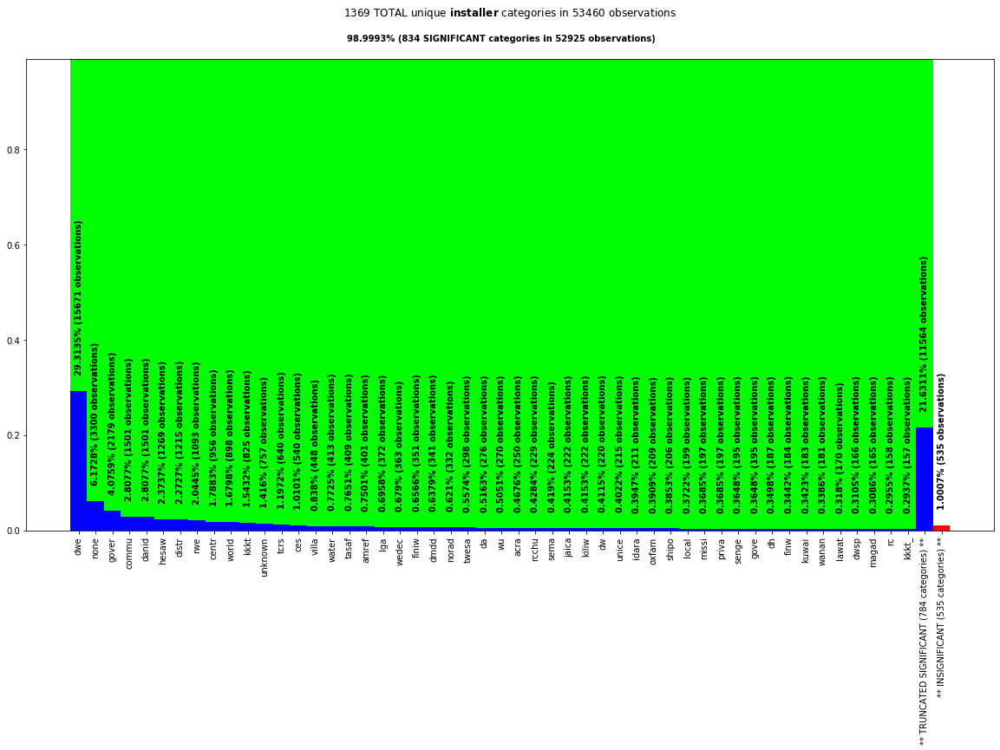

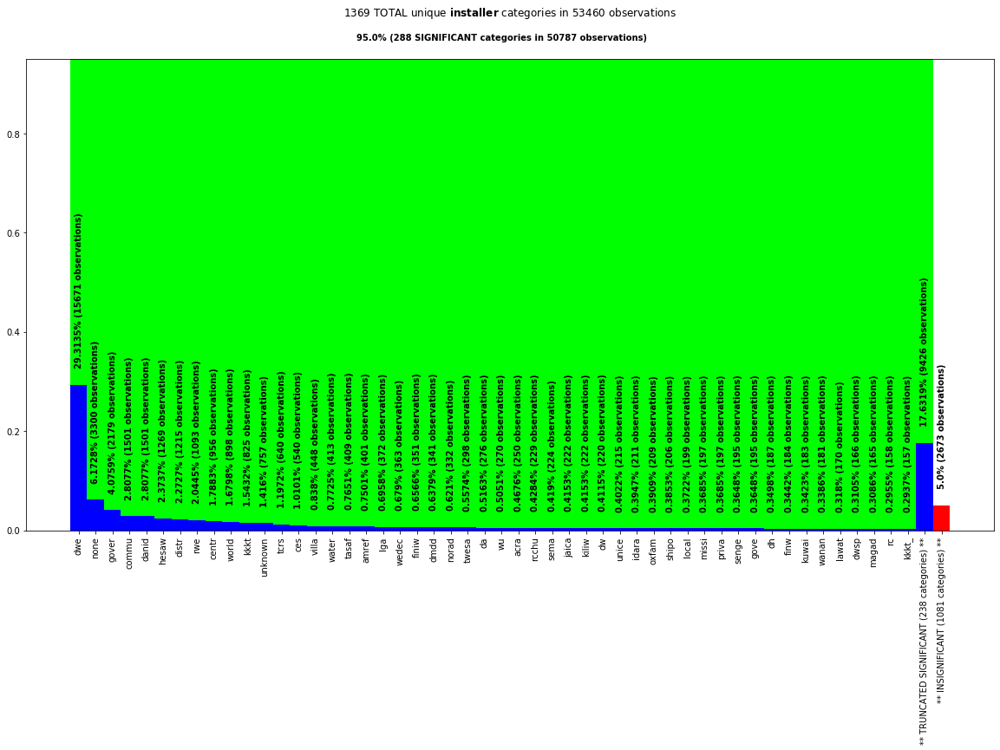

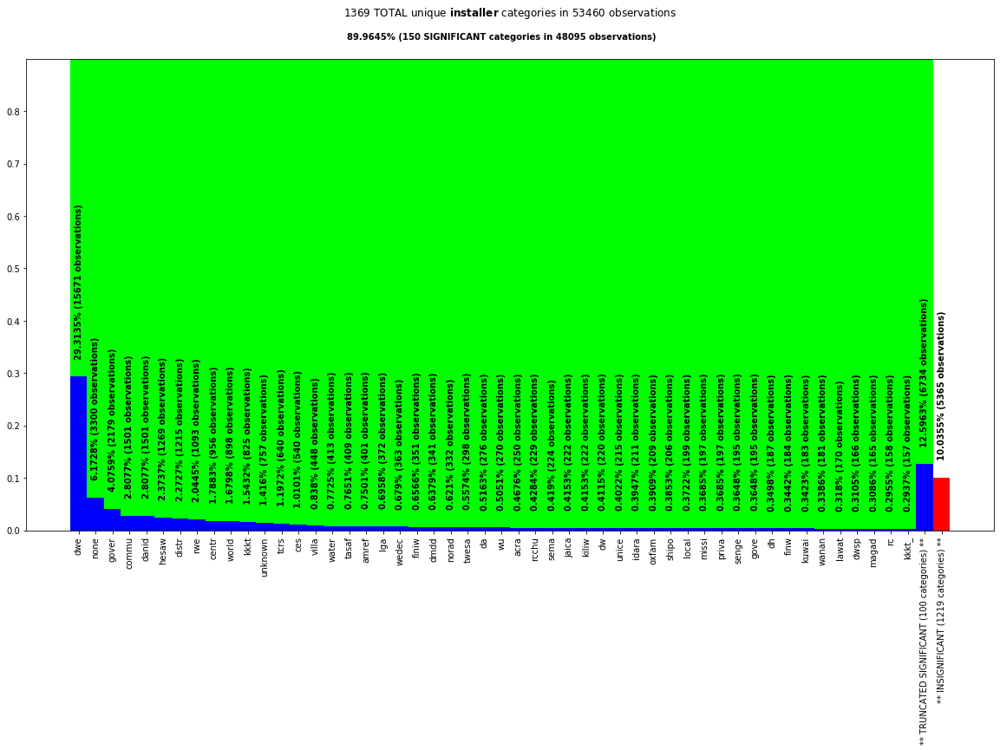

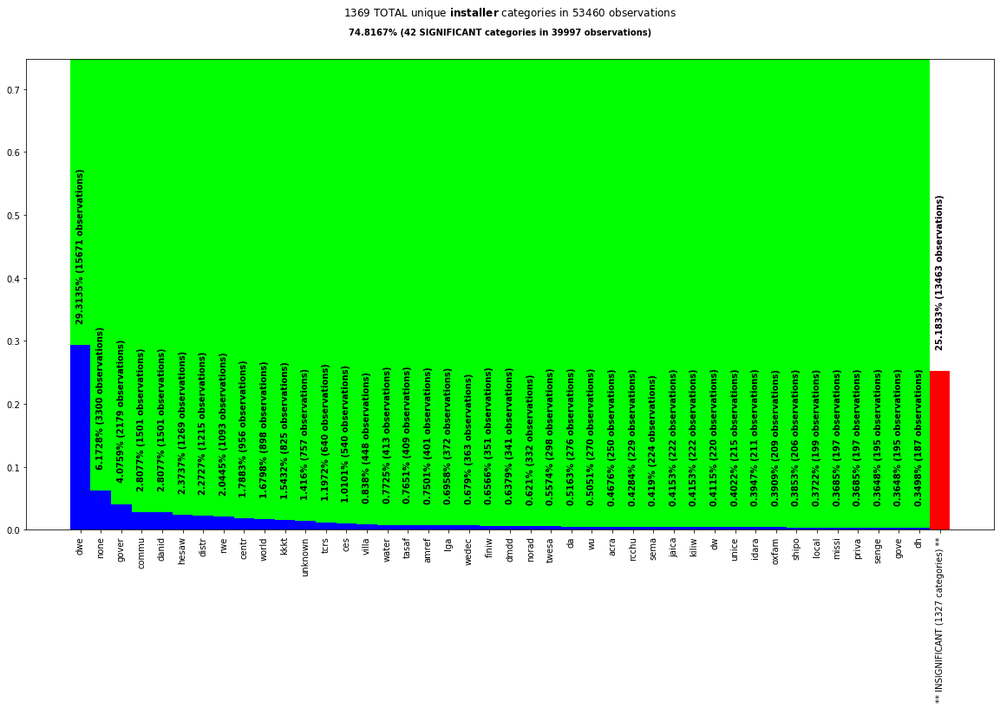

In [125]:
percentiles = [99, 95, 90, 75]
map_to_candidates = ['none', 'other', 'unknown']
truncate_sig_after_n = 50

installer_result_by_percentile = scjpnutils.analyze_categorical_reduction(
    X_train_cat, 
    'X_train_cat', 
    'installer', 
    percentiles=percentiles, 
    suppress_100th_percentile_display=True,
    map_to_candidates=map_to_candidates, 
    truncate_sig_after_n=truncate_sig_after_n
)

Using the 75th percentile approach, we reduce the magnitude of the set if unique values more than 3200%, from 1399 (after 5-char abbreviation replacement), all the way down to only 42 unique categories, which represent approx. 75% of the top-frequently observed categories.  Sounds pretty good!

But, before we commit to this strategy, let's investigate the flat top-n approach.

<p><br>
<h6>top-n approach</h6>
We will consider the top-10 most frequent categories.

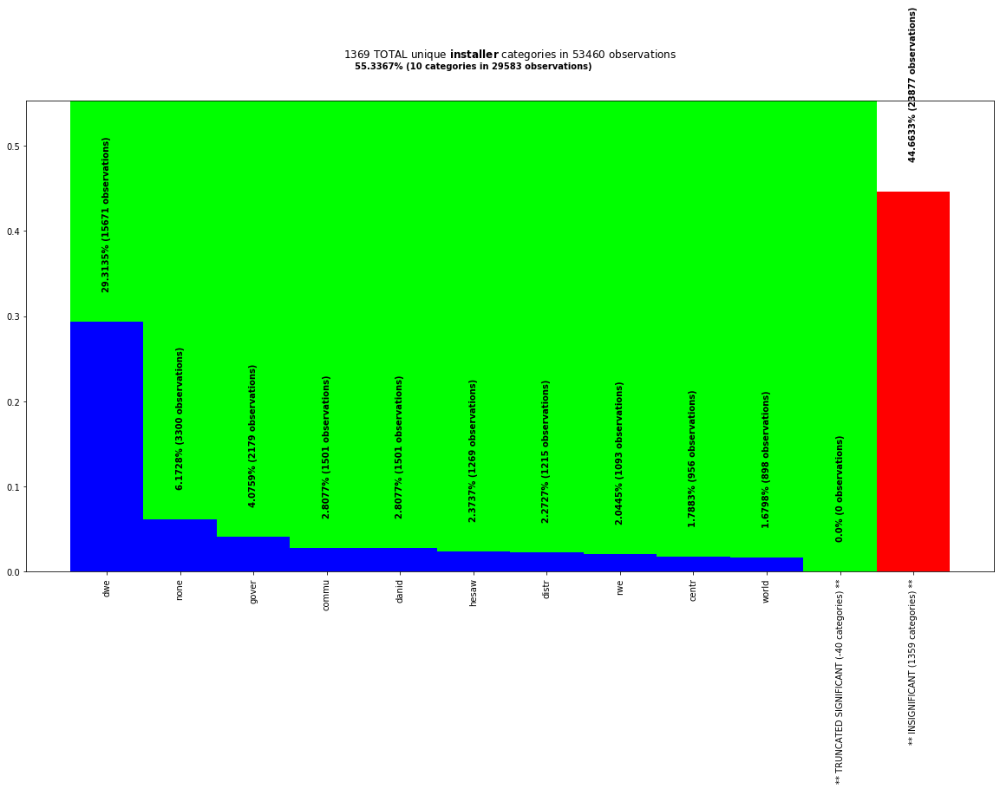

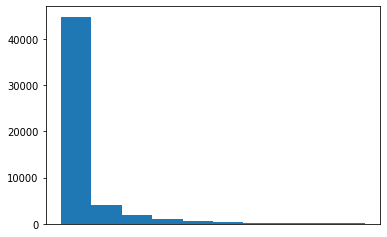

In [126]:
top_n = 10

installer_result_by_top_n = scjpnutils.analyze_categorical_reduction__top_n(
    X_train_cat,
    'X_train_cat', 
    'installer',  
    top_n,
    map_to_candidates=map_to_candidates, 
    truncate_sig_after_n=truncate_sig_after_n
)

With this approach, we see we still capture a decent amount of information (approx. 55% of the observations) in only 10 categories.  That's fairly amazing, considering.  But we do lose some desirable information to have, such as the <b>unknown</b> installer category.  But, in reality, losing 45% of the information is way too much to sacrifice.

We will opt to use the (75th) percentile approach instead.

In [127]:
if eda_config['insig_cat_handling']['installer']['strategy']=='percentile':
    scjpnutils.helper__summarize_categorical_reduction(
        installer_result_by_percentile, 
        'installer', 
        eda_config['insig_cat_handling']['installer']['threshold'], 
        eda_config['insig_cat_handling']['installer']['map_to']
    )

We need to capture all of the above preprocessing within a `FunctionTransformer` (which will ultimately wrap a `SimpleValueTransformer`).  We need a corresponding function first.

In [128]:
def replace_insig_categories(df, feat, strategy, sig, map_to):
    if eda_config['insig_cat_handling'][feat]['strategy']=='flat':
        _result = scjpnutils.analyze_categorical_reduction__top_n(
            df, 
            '', 
            feat, 
            top_n=eda_config['insig_cat_handling'][feat]['threshold'], 
            suppress_output=True
        )
    else:
        _result = scjpnutils.analyze_categorical_reduction(
            df, 
            '', 
            feat, 
            percentiles=[eda_config['insig_cat_handling'][feat]['threshold']], 
            suppress_output=True
        )
    replace_insig_categories_rules = []
    for insig_cat_val in _result[eda_config['insig_cat_handling'][feat]['threshold']]['insig'][0]:
        replace_insig_categories_rules.append({
            'missing_values': insig_cat_val,
            'strategy': 'constant',
            'fill_value': eda_config['insig_cat_handling'][feat]['map_to']
        })
    replace_insig_categories_rules = {feat: replace_insig_categories_rules}
    svt_insig_categories = SimpleValueTransformer(replace_insig_categories_rules)
    return svt_insig_categories.fit_transform(df)

Let's now commit this preprocessing to the `Pipeline`.

In [129]:
ft_replace_insig_installer = FunctionTransformer(
    lambda X: replace_insig_categories(
        X, 
        'installer', 
        strategy=eda_config['insig_cat_handling']['installer']['strategy'], 
        sig=eda_config['insig_cat_handling']['installer']['threshold'], 
        map_to=eda_config['insig_cat_handling']['installer']['map_to']
    ), 
    validate=False
)
X_train_cat = ft_replace_insig_installer.fit_transform(X_train_cat)

# do the same for "throw-away" version of X_unlabeled and X_test since we will use union of unique categories between them for one-hot encoding
X_unlabeled_cat_throw_away = ft_replace_insig_installer.fit_transform(X_unlabeled_cat_throw_away)
X_test_cat_throw_away = ft_replace_insig_installer.fit_transform(X_test_cat_throw_away)

# add this step to the pipeline
categorical_transformer.steps.append(['ft_replace_insig_installer', ft_replace_insig_installer])

<p><br>
<h5>scheme_name</h5>

In [130]:
scjpnutils.minimize_loss__first_n_chars_reduction(
    X_train_cat, 
    'X_train_cat', 
    'scheme_name', 
    target_first_n_chars__start=10, 
    target_first_n_chars__stop=4,
    verbose=False
);

Similar to <b>installer</b>, in spite of the warnings of lost information, let's look further into the first-5 letters of <b>scheme_name</b> replacement scheme.

In [131]:
X_train_cat_scheme_name_abbrev_replacement_candidate, _, _, _ = scjpnutils.reduce_unique__first_n_chars(
    X_train_cat, 
    'X_train_cat', 
    'scheme_name', 
    target_first_n_chars=5,
    suppress_output=False
)

,scheme_names,n_scheme_names
scheme_name_abbrev,,
adpsi,"[adpsimbo, adpsimbu]",2
amani,"[amaniwatersupply, amanispring]",2
blbin,"[blbingatia, blbingatib]",2
blemb,"[blembokoi, blembukoi]",2
blkas,"[blkashashi, blkashofu]",2
blkik,"[blkikafu, blkikwewatersupply]",2
blkil,"[blkilingi, blkilarisister, blkilarisisters, blkilimasimba]",4
blkir,"[blkirishi, blkiruwa]",2
blkit,"[blkitahemu, blkitahemo]",2


Again, similar to <b>installer</b>, the first 5 letters of <b>scheme_name</b> categories do very well to represent each category.  Let's commit this abbreviation replacement strategy to the `Pipeline`.

In [132]:
ft_replace_scheme_name_with_optimal_abbrev = FunctionTransformer(
    lambda X: scjpnutils.reduce_unique__first_n_chars(
        X, 
        '', 
        'scheme_name', 
        target_first_n_chars=5,
        suppress_output=True
    )[0], 
    validate=False
)
X_train_cat = ft_replace_scheme_name_with_optimal_abbrev.fit_transform(X_train_cat)

# do the same for "throw-away" version of X_unlabeled and X_test since we will use union of unique categories between them for one-hot encoding
X_unlabeled_cat_throw_away = ft_replace_scheme_name_with_optimal_abbrev.fit_transform(X_unlabeled_cat_throw_away)
X_test_cat_throw_away = ft_replace_scheme_name_with_optimal_abbrev.fit_transform(X_test_cat_throw_away)

# add this step to the pipeline
categorical_transformer.steps.append(['ft_replace_scheme_name_with_optimal_abbrev', ft_replace_scheme_name_with_optimal_abbrev])

In [133]:
replace_unknown_scheme_name_rules = {
    'scheme_name': [
        {'missing_values': "notkn", 'strategy': 'constant', 'fill_value': 'unknown'},
        {'missing_values': "unkno", 'strategy': 'constant', 'fill_value': 'unknown'}
    ]
}
svt_unknown_scheme_name = SimpleValueTransformer(replace_unknown_scheme_name_rules)

X_train_cat = svt_unknown_scheme_name.fit_transform(X_train_cat)

# do the same for "throw-away" version of X_unlabeled and X_test since we will use union of unique categories between them for one-hot encoding
X_unlabeled_cat_throw_away = svt_unknown_scheme_name.fit_transform(X_unlabeled_cat_throw_away)
X_test_cat_throw_away = svt_unknown_scheme_name.fit_transform(X_test_cat_throw_away)

# add this step to the pipeline
categorical_transformer.steps.append(['svt_unknown_scheme_name', svt_unknown_scheme_name])

Again, similar to <b>installer</b>, we will examine the best strategy to capture the most information represented in the fewest categories <i>based on frequency of category occurence</i>: <b>percentile</b> vs. flat <b>top-n</b>.

Let's examine the <b>percentile</b> approach first.

<p><br>
<h6>top percentile approach</h6>
We will consider the following percentiles: 99, 95, 90, 75.

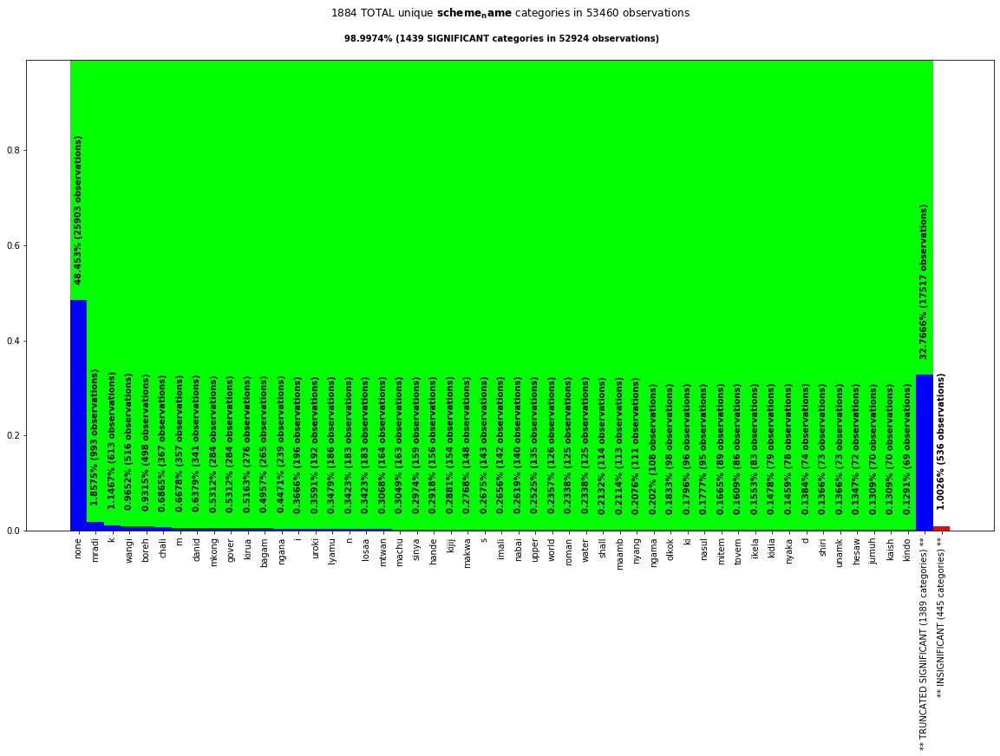

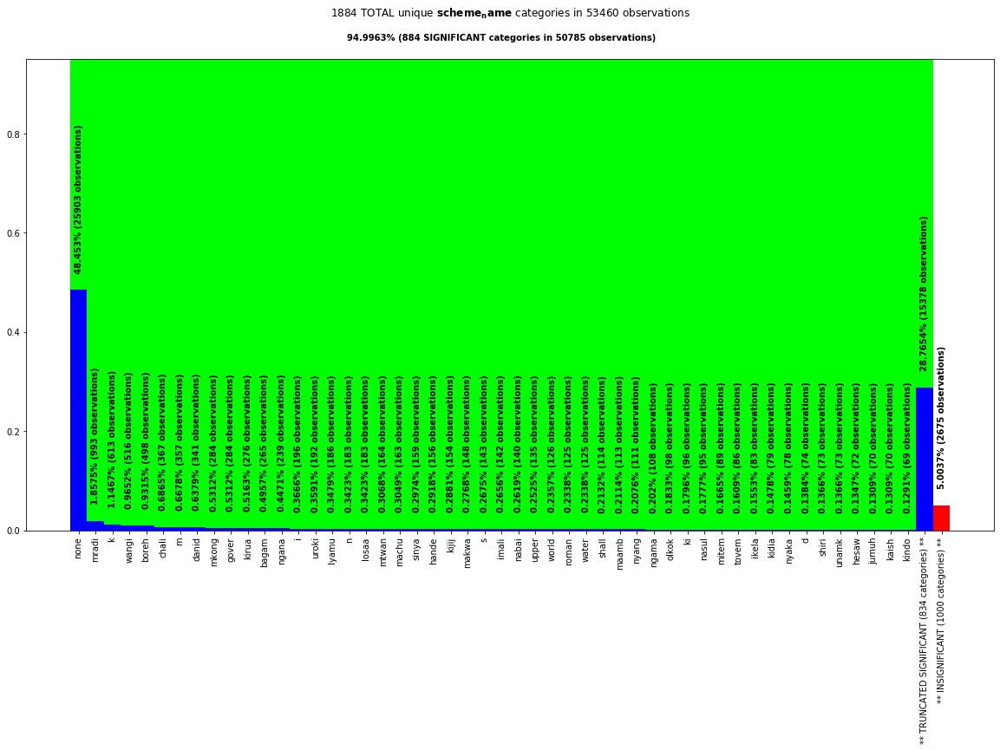

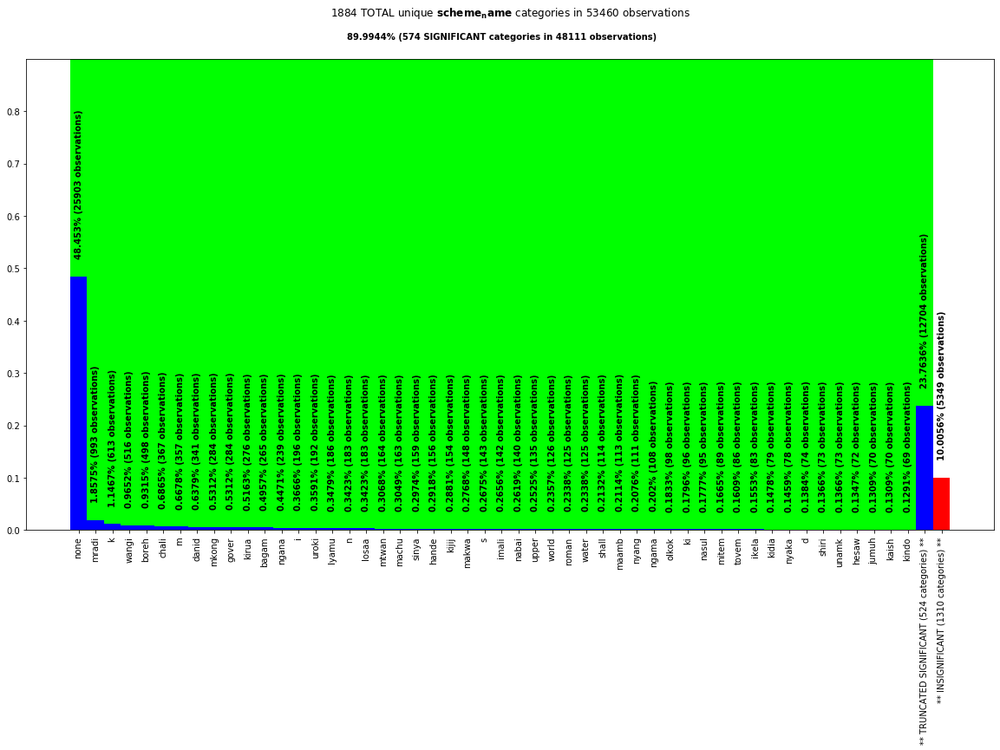

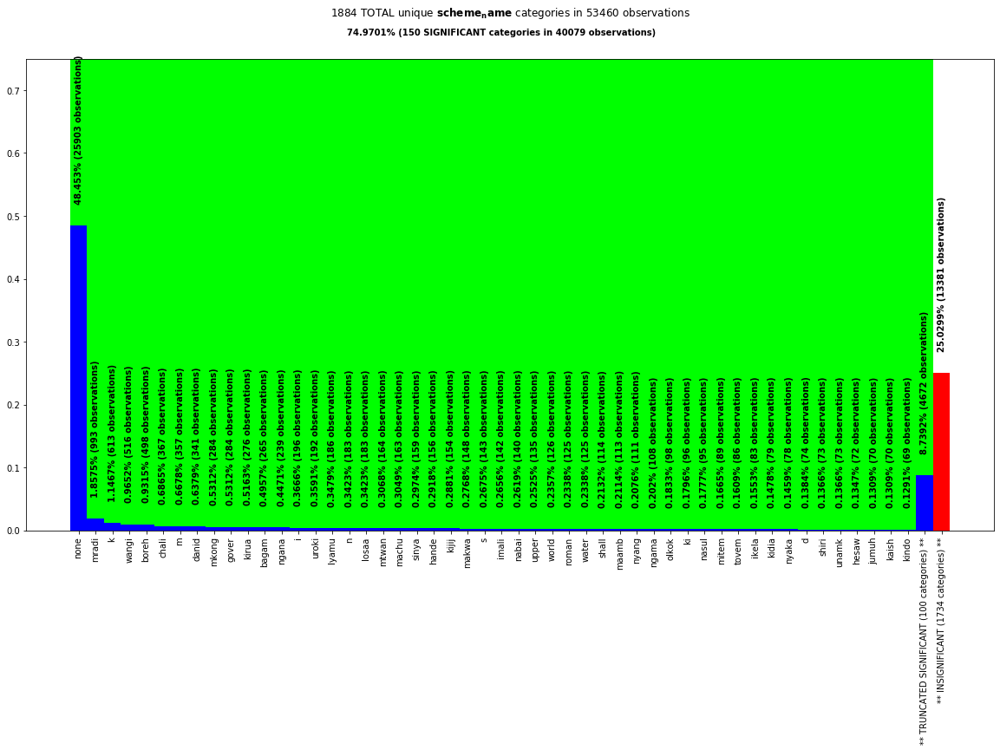

In [134]:
scheme_name_result_by_percentile = scjpnutils.analyze_categorical_reduction(
    X_train_cat, 
    'X_train_cat', 
    'scheme_name', 
    percentiles=percentiles, 
    suppress_100th_percentile_display=True,
    truncate_sig_after_n=truncate_sig_after_n
)

Using the 75th percentile approach, we reduce the magnitude of the set if unique values more than 1150%, from 1901 (after 5-char abbreviation replacement), down to 150 unique categories, which represent approx. 75% of the top-frequently observed categories.  This result is not as good as the result we enjoyed in the <b>installer</b> case, but this result is still pretty good.

But, before we commit to this strategy, let's investigate the flat top-n approach.

<p><br>
<h6>top-n approach</h6>
We will consider the top-10 most frequent categories.

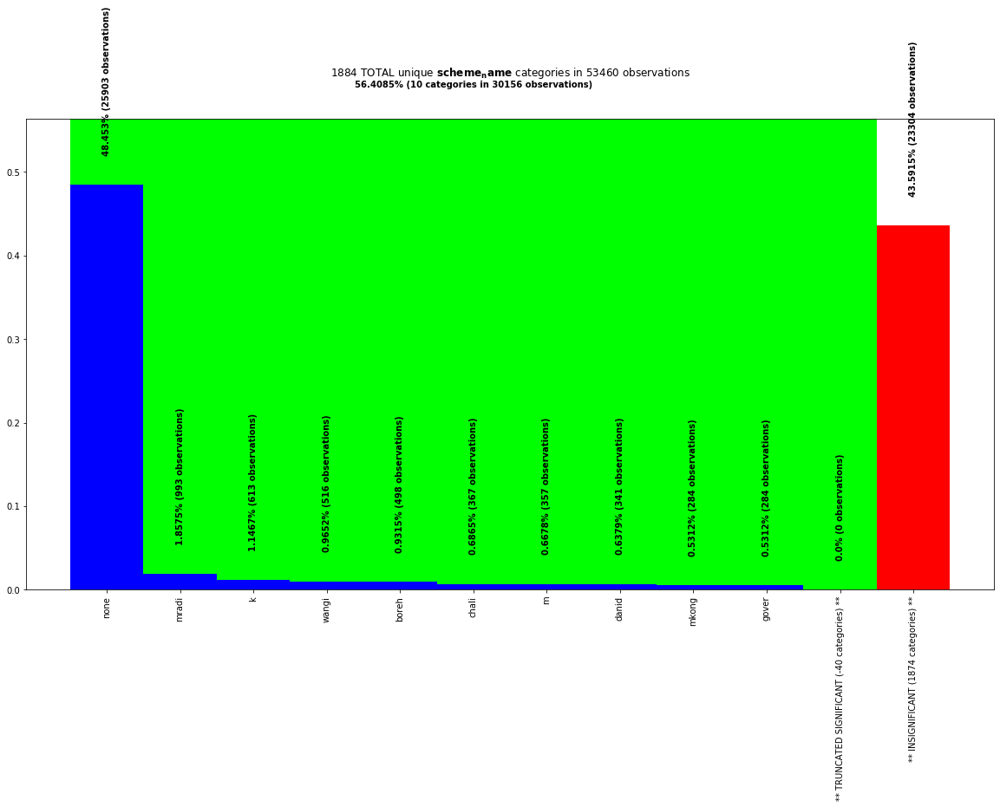

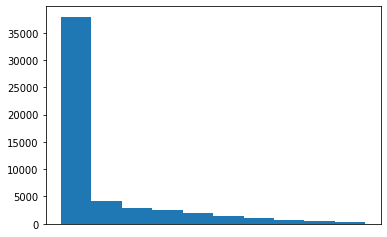

In [135]:
top_n = 10

scheme_name_result_by_top_n = scjpnutils.analyze_categorical_reduction__top_n(
    X_train_cat,
    'X_train_cat', 
    'scheme_name',  
    top_n,
    map_to_candidates=map_to_candidates, 
    truncate_sig_after_n=truncate_sig_after_n
)

Also similar to <b>installer</b>, with this approach for <b>scheme_name</b>, we see we still capture a fair amount of information (approx. 56% of the observations) in only 10 categories.  And, yet again, similar to <b>installer</b>, losing approx 45% of the information contained in <b>scheme_name</b> is way too much to sacrifice.

In [136]:
if eda_config['insig_cat_handling']['scheme_name']['strategy']=='percentile':
    scjpnutils.helper__summarize_categorical_reduction(
        scheme_name_result_by_percentile, 
        'scheme_name', 
        eda_config['insig_cat_handling']['scheme_name']['strategy'], 
        eda_config['insig_cat_handling']['scheme_name']['map_to']
    )

In [137]:
ft_replace_insig_scheme_name = FunctionTransformer(
    lambda X: replace_insig_categories(
        X, 
        'scheme_name', 
        strategy=eda_config['insig_cat_handling']['scheme_name']['strategy'], 
        sig=eda_config['insig_cat_handling']['scheme_name']['threshold'], 
        map_to=eda_config['insig_cat_handling']['scheme_name']['map_to']
    ), 
    validate=False
)
X_train_cat = ft_replace_insig_scheme_name.fit_transform(X_train_cat)

# do the same for "throw-away" version of X_unlabeled and X_test since we will use union of unique categories between them for one-hot encoding
X_unlabeled_cat_throw_away = ft_replace_insig_scheme_name.fit_transform(X_unlabeled_cat_throw_away)
X_test_cat_throw_away = ft_replace_insig_scheme_name.fit_transform(X_test_cat_throw_away)

# add this step to the pipeline
categorical_transformer.steps.append(['ft_replace_insig_scheme_name', ft_replace_insig_scheme_name])

<p><br>
<h5>ward</h5>

In [138]:
scjpnutils.minimize_loss__first_n_chars_reduction(
    X_train_cat, 
    'X_train_cat', 
    'ward', 
    target_first_n_chars__start=10, 
    target_first_n_chars__stop=4,
    verbose=False
);

In [139]:
X_train_cat_ward_abbrev_replacement_candidate, _, _, _ = scjpnutils.reduce_unique__first_n_chars(
    X_train_cat, 
    'X_train_cat', 
    'ward', 
    target_first_n_chars=5,
    suppress_output=False
)

,wards,n_wards
ward_abbrev,,
basso,"[bassodesh, bassotu]",2
bereg,"[berega, berege]",2
bonde,"[bondelasongwe, bondeni]",2
bugan,"[buganguzi, bugandika]",2
bugor,"[bugoro, bugorora]",2
bukom,"[bukombe, bukome]",2
bukon,"[bukongo, bukondo]",2
bukum,"[bukumbi, bukumi]",2
bumbu,"[bumbuli, bumbuta]",2


In [140]:
ft_replace_ward_with_optimal_abbrev = FunctionTransformer(
    lambda X: scjpnutils.reduce_unique__first_n_chars(
        X, 
        '', 
        'ward', 
        target_first_n_chars=5,
        suppress_output=True
    )[0], 
    validate=False
)
X_train_cat = ft_replace_ward_with_optimal_abbrev.fit_transform(X_train_cat)

# do the same for "throw-away" version of X_unlabeled and X_test since we will use union of unique categories between them for one-hot encoding
X_unlabeled_cat_throw_away = ft_replace_ward_with_optimal_abbrev.fit_transform(X_unlabeled_cat_throw_away)
X_test_cat_throw_away = ft_replace_ward_with_optimal_abbrev.fit_transform(X_test_cat_throw_away)

# add this step to the pipeline
categorical_transformer.steps.append(['ft_replace_ward_with_optimal_abbrev', ft_replace_ward_with_optimal_abbrev])

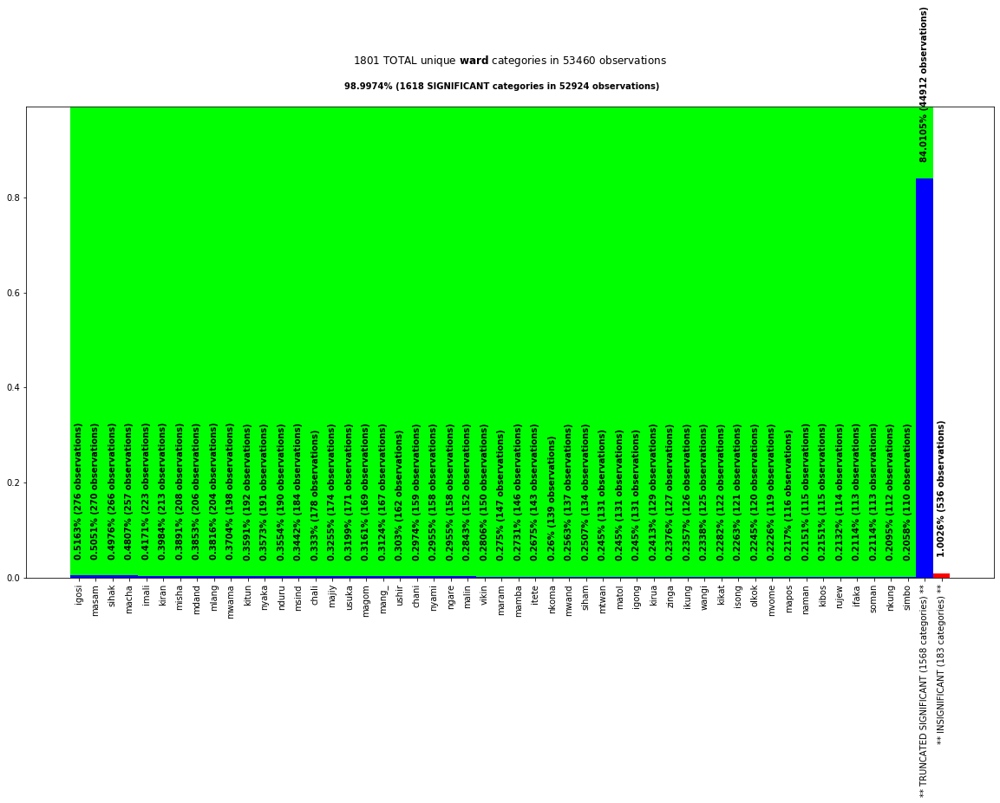

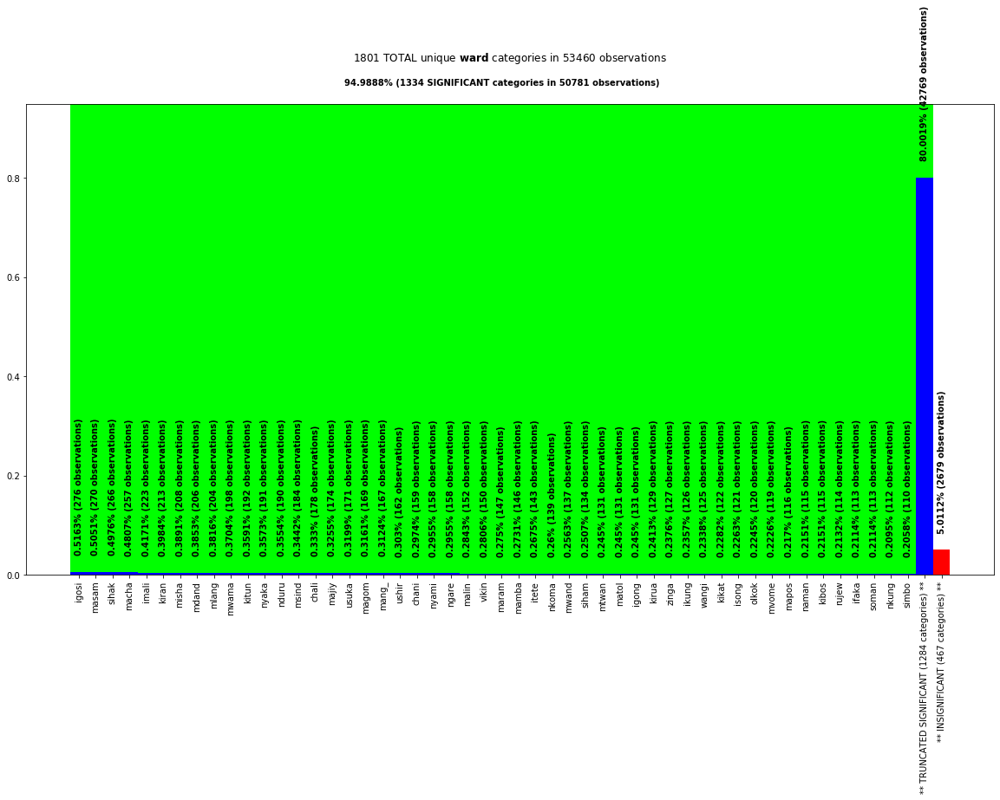

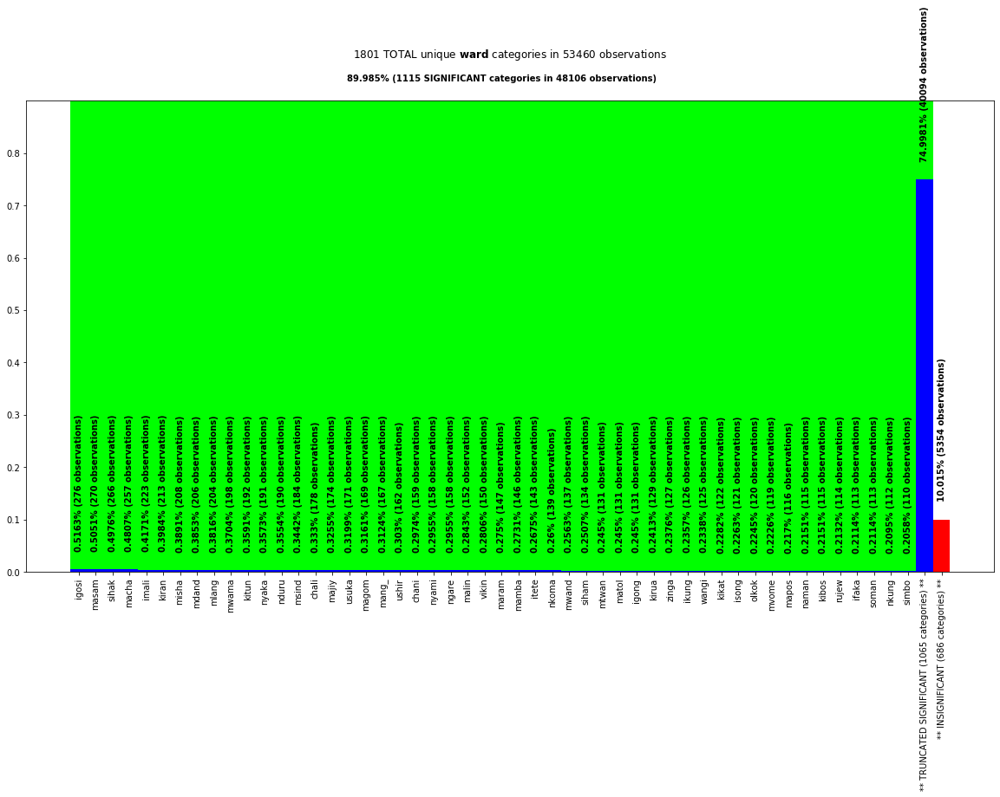

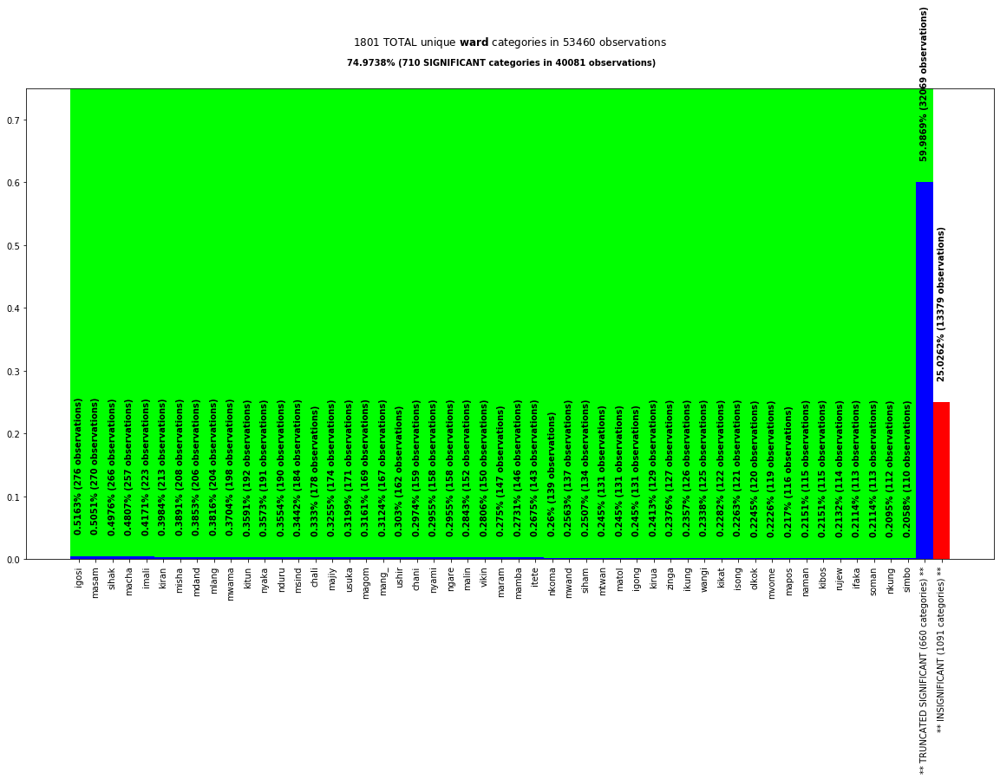

In [141]:
scheme_name_result_by_percentile = scjpnutils.analyze_categorical_reduction(
    X_train_cat, 
    'X_train_cat', 
    'ward', 
    percentiles=percentiles, 
    suppress_100th_percentile_display=True,
    truncate_sig_after_n=truncate_sig_after_n
)

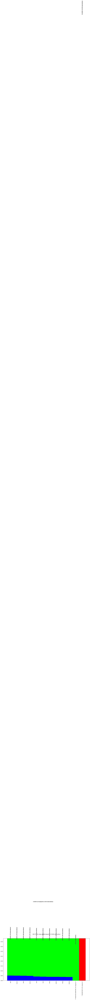

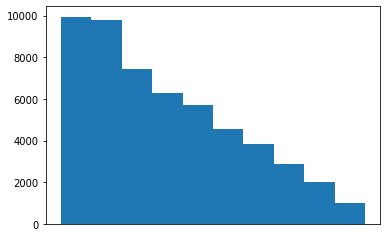

In [142]:
top_n = 10

ward_result_by_top_n = scjpnutils.analyze_categorical_reduction__top_n(
    X_train_cat,
    'X_train_cat', 
    'ward',  
    top_n,
    map_to_candidates=map_to_candidates, 
    truncate_sig_after_n=truncate_sig_after_n
)

In [143]:
if eda_config['insig_cat_handling']['ward']['strategy']=='percentile':
    scjpnutils.helper__summarize_categorical_reduction(
        ward_result_by_percentile, 
        'ward', 
        eda_config['insig_cat_handling']['ward']['strategy'], 
        eda_config['insig_cat_handling']['ward']['map_to']
    )

In [144]:
ft_replace_insig_ward = FunctionTransformer(
    lambda X: replace_insig_categories(
        X, 
        'ward', 
        strategy=eda_config['insig_cat_handling']['ward']['strategy'], 
        sig=eda_config['insig_cat_handling']['ward']['threshold'], 
        map_to=eda_config['insig_cat_handling']['ward']['map_to']
    ), 
    validate=False
)
X_train_cat = ft_replace_insig_ward.fit_transform(X_train_cat)

# do the same for "throw-away" version of X_unlabeled and X_test since we will use union of unique categories between them for one-hot encoding
X_unlabeled_cat_throw_away = ft_replace_insig_ward.fit_transform(X_unlabeled_cat_throw_away)
X_test_cat_throw_away = ft_replace_insig_ward.fit_transform(X_test_cat_throw_away)

# add this step to the pipeline
categorical_transformer.steps.append(['ft_replace_insig_ward', ft_replace_insig_ward])

In [145]:
str_feat_unique_nonalphabetic_string_vals, df_analysis = scjpnutils.analyze_non_alphanumeric_strings(X_train_cat, 'X_train_cat');

scjpnutils.analyze_values(
    X_train_cat, 
    'X_train_cat (AFTER "manual" MCA)',  
    standard_options_kargs={'sort_unique_vals':True,'normalize_lcase':True,'hide_cols':True}
);

,feature,n_unique,n_non_alphanumeric_str,non_alphanumeric_str_index
0,installer,11,0,None
1,basin,9,9452,"Int64Index([31178, 29574, 466, 42516, 24889,..."
2,ward,11,0,None
4,scheme_management,12,0,None
5,scheme_name,11,0,None
7,extraction_type_class,7,102,"Int64Index([32212, 15460, 14299, 10595, 36924,..."
8,management_group,5,47258,"Int64Index([31178, 9485, 955, 29186, 46076,..."
9,payment_type,7,0,None
10,quality_group,6,0,None
11,quantity,5,0,None


,feature,dtype,n_unique,unique_vals
0,installer,object,11,"[centr, commu, danid, distr, dwe, gover, hesaw..."
1,basin,object,9,"[internal, lakenyasa, lakerukwa, laketanganyik..."
2,ward,object,11,"[igosi, imali, kiran, macha, masam, mdand, mis..."
3,public_meeting,bool,2,"[False, True]"
4,scheme_management,object,12,"[company, none, other, parastatal, privateoper..."
5,scheme_name,object,11,"[boreh, chali, danid, gover, k, m, mkong, mrad..."
6,permit,bool,2,"[False, True]"
7,extraction_type_class,object,7,"[gravity, handpump, motorpump, other, ropepump..."
8,management_group,object,5,"[commercial, other, parastatal, unknown, user_..."
9,payment_type,object,7,"[annually, monthly, neverpay, onfailure, other..."


In [146]:
X_train_cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53460 entries, 44928 to 56422
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   installer              53460 non-null  object
 1   basin                  53460 non-null  object
 2   ward                   53460 non-null  object
 3   public_meeting         53460 non-null  bool  
 4   scheme_management      53460 non-null  object
 5   scheme_name            53460 non-null  object
 6   permit                 53460 non-null  bool  
 7   extraction_type_class  53460 non-null  object
 8   management_group       53460 non-null  object
 9   payment_type           53460 non-null  object
 10  quality_group          53460 non-null  object
 11  quantity               53460 non-null  object
 12  source                 53460 non-null  object
 13  waterpoint_type        53460 non-null  object
dtypes: bool(2), object(12)
memory usage: 7.9+ MB


<p><br>
<h4>One-Hot Encoding</h4>

In [147]:
# first compute union of all CLEANED categories
ohe_categories = []
for cat_feat in cat_feats:
    display(HTML(f"unique categories for <b>{cat_feat}</b>:"))
    categories_union = set()

    categories_for_feat__X_train = set(X_train_cat[cat_feat].unique())
    display(HTML(f"{scjpnutils.helper__HTML_tabs(1)}in <b>training</b> dataset: {categories_for_feat__X_train}"))
    categories_union |= categories_for_feat__X_train

    categories_for_feat__X_test_cat_throw_away = set(X_test_cat_throw_away[cat_feat].unique())
    display(HTML(f"{scjpnutils.helper__HTML_tabs(1)}in <b>test-throwaway</b> dataset: {categories_for_feat__X_test_cat_throw_away}"))
    categories_union |= categories_for_feat__X_test_cat_throw_away

    categories_for_feat__X_unlabeled_cat_throw_away = set(X_unlabeled_cat_throw_away[cat_feat].unique())
    display(HTML(f"{scjpnutils.helper__HTML_tabs(1)}in <b>unlabeled-throwaway</b> dataset: {categories_for_feat__X_unlabeled_cat_throw_away}"))
    categories_union |= categories_for_feat__X_unlabeled_cat_throw_away

    display(HTML(f"{scjpnutils.helper__HTML_tabs(1)}in <b>UNIONed</b>: {categories_union}"))

    ohe_categories.append(list(categories_union))

    display(HTML("<p><br>"))

ohe_cat_predictors = OneHotEncodingTransformer(cat_feats_to_encode=cat_feats, categories_by_feat_idx=ohe_categories)

X_train_cat_dummies = ohe_cat_predictors.fit_transform(X_train_cat)

# add this step to the pipeline
categorical_transformer.steps.append(['ohe', ohe_cat_predictors])

In [148]:
X_train_cat_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53460 entries, 44928 to 56422
Data columns (total 97 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   installer_danid                            53460 non-null  float64
 1   installer_gover                            53460 non-null  float64
 2   installer_dwe                              53460 non-null  float64
 3   installer_none                             53460 non-null  float64
 4   installer_hesaw                            53460 non-null  float64
 5   installer_world                            53460 non-null  float64
 6   installer_rwe                              53460 non-null  float64
 7   installer_other                            53460 non-null  float64
 8   installer_distr                            53460 non-null  float64
 9   installer_centr                            53460 non-null  float64
 10  basin_rufiji      

<p><br>
<h3>Final TRAINING Data</h3>

In [149]:
#data_train = preprocessor.fit_transform()

# for now
data_train = pd.concat([X_train_cat_dummies, scaled_X_train_cont], axis=1, join='inner')
data_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53460 entries, 44928 to 56422
Columns: 101 entries, installer_danid to pump_age
dtypes: float64(101)
memory usage: 44.1 MB


In [150]:
fname = scjpnutils.get_data_fname(eda_config, data_kwargs={'is_labels':False,'type':'train'})
data_train.to_csv(fname, sep=',')
print(f"updated {fname}")

updated wrangled-labeled-data-train-db63dd93529739a8ff24e61570c22f0a.csv


In [151]:
fname = scjpnutils.get_data_fname(eda_config, data_kwargs={'is_labels':True,'type':'train'})
pd.DataFrame(y_train, columns=['status_group']).to_csv(fname, sep=',')
print(f"updated {fname}")

updated labels-train-db63dd93529739a8ff24e61570c22f0a.csv


<p><br><br>
<h2>Clean TEST Predictors (using the piplelines we've created)</h2>
First, let's have a look at the pipelines.

In [152]:
# preprocessor = ColumnTransformer(
#     transformers=[
#         ('cont', continuous_transformer, cont_feats) 
#         ('cat', categorical_transformer, cont_feats + cont_feats_to_drop) # note that we pass in list of cont_feats since cat_feats are assumed to be the complement
#     ]
# )

print(categorical_transformer)
print("\n\n")
print(continuous_transformer)

Pipeline(steps=[('data_cleaner',
                 Pipeline(steps=[('passthrough', None),
                                 ['drop_non_contrib name',
                                 ['null_imputer name',
                                 ['drop_dup name',
                                  <scjpnlib.utils.skl_transformers.DropColumnsTransformer object...
                ['ft_replace_insig_scheme_name',
                 FunctionTransformer(func=<function <lambda> at 0x7fcaa6316f80>)],
                ['ft_replace_ward_with_optimal_abbrev',
                 FunctionTransformer(func=<function <lambda> at 0x7fcaa43e79e0>)],
                ['ft_replace_insig_ward',
                 FunctionTransformer(func=<function <lambda> at 0x7fcaa76b6320>)],
                ['ohe',
                 <scjpnlib.utils.skl_transformers.OneHotEncodingTransformer object at 0x7fcaac2dc490>]])



Pipeline(steps=[('data_cleaner',
                 Pipeline(steps=[('passthrough', None),
                             

Everything looks good.  Let's apply these to our raw testing data in order to produce our final, cleaned testing data.

<h3>Categorical</h3>

In [153]:
# test
X_test_cat_dummies = categorical_transformer.fit_transform(X_test).set_index(X_test.index)
X_test_cat_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5940 entries, 2980 to 26085
Data columns (total 97 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   installer_danid                            5940 non-null   float64
 1   installer_gover                            5940 non-null   float64
 2   installer_dwe                              5940 non-null   float64
 3   installer_none                             5940 non-null   float64
 4   installer_hesaw                            5940 non-null   float64
 5   installer_world                            5940 non-null   float64
 6   installer_rwe                              5940 non-null   float64
 7   installer_other                            5940 non-null   float64
 8   installer_distr                            5940 non-null   float64
 9   installer_centr                            5940 non-null   float64
 10  basin_rufiji        

<p><br>
<h3>Continuous</h3>

In [154]:
# test
scaled_X_test_cont = pd.DataFrame(continuous_transformer.transform(X_test), columns=X_train_cont.columns, index=X_test.index)
scaled_X_test_cont.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5940 entries, 2980 to 26085
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   amount_tsh  5940 non-null   float64
 1   gps_height  5940 non-null   float64
 2   population  5940 non-null   float64
 3   pump_age    5940 non-null   float64
dtypes: float64(4)
memory usage: 232.0 KB


In [155]:
scaled_X_test_cont.describe()

,amount_tsh,gps_height,population,pump_age
count,5940.000000,5940.000000,5940.000000,5940.000000
mean,0.000944,0.255550,0.006028,0.387835
std,0.007109,0.244865,0.016054,0.225179
min,0.000000,-0.009531,0.000000,0.000660
25%,0.000000,0.022238,0.000000,0.188735
50%,0.000000,0.144899,0.000787,0.486264
75%,0.000071,0.485792,0.006885,0.515361
max,0.394286,0.889516,0.262295,1.000000


<p><br>
<h3>Final TESTING Data</h3>

In [156]:
data_test = pd.concat([X_test_cat_dummies, scaled_X_test_cont], axis=1, join='inner')
data_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5940 entries, 2980 to 26085
Columns: 101 entries, installer_danid to pump_age
dtypes: float64(101)
memory usage: 4.6 MB


In [157]:
fname = scjpnutils.get_data_fname(eda_config, data_kwargs={'is_labels':False,'type':'test'})
data_test.to_csv(fname, sep=',')
print("updated {}".format(fname))

updated wrangled-labeled-data-test-db63dd93529739a8ff24e61570c22f0a.csv


In [158]:
fname = scjpnutils.get_data_fname(eda_config, data_kwargs={'is_labels':True,'type':'test'})
pd.DataFrame(y_test, columns=['status_group']).to_csv(fname, sep=',')
print("updated {}".format(fname))

updated labels-test-db63dd93529739a8ff24e61570c22f0a.csv
